# Siren Exploration

This is a colab to explore properties of the Siren MLP, proposed in our work [Implicit Neural Activations with Periodic Activation Functions](https://vsitzmann.github.io/siren).


We will first implement a streamlined version of Siren for fast experimentation. This lacks the code to easily do baseline comparisons - please refer to the main code for that - but will greatly simplify the code!

**Make sure that you have enabled the GPU under Edit -> Notebook Settings!**

We will then reproduce the following results from the paper:
* [Fitting an image](#section_1)
* [Fitting an audio signal](#section_2)
* [Solving Poisson's equation](#section_3)
* [Initialization scheme & distribution of activations](#activations)
* [Distribution of activations is shift-invariant](#shift_invariance)

We will also explore Siren's [behavior outside of the training range](#out_of_range).

Let's go! First, some imports, and a function to quickly generate coordinate grids.

In [1]:
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import os

from PIL import Image
from torchvision.transforms import Resize, Compose, ToTensor, Normalize
import numpy as np
import skimage
import matplotlib.pyplot as plt

import time

print(torch.cuda.memory_allocated())

def get_mgrid(sidelen, dim=2):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

0


Now, we code up the sine layer, which will be the basic building block of SIREN. This is a much more concise implementation than the one in the main code, as here, we aren't concerned with the baseline comparisons.

In [2]:
class SineLayer(nn.Module):
    # See paper sec. 3.2, final paragraph, and supplement Sec. 1.5 for discussion of omega_0.

    # If is_first=True, omega_0 is a frequency factor which simply multiplies the activations before the
    # nonlinearity. Different signals may require different omega_0 in the first layer - this is a
    # hyperparameter.

    # If is_first=False, then the weights will be divided by omega_0 so as to keep the magnitude of
    # activations constant, but boost gradients to the weight matrix (see supplement Sec. 1.5)

    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30):
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first

        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)

        self.init_weights()

    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                self.linear.weight.uniform_(-1 / self.in_features,
                                             1 / self.in_features)
            else:
                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0,
                                             np.sqrt(6 / self.in_features) / self.omega_0)

    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))

    def forward_with_intermediate(self, input):
        # For visualization of activation distributions
        intermediate = self.omega_0 * self.linear(input)
        return torch.sin(intermediate), intermediate


class Siren(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False,
                 first_omega_0=30, hidden_omega_0=30.):
        super().__init__()

        self.net = []
        self.net.append(SineLayer(in_features, hidden_features,
                                  is_first=True, omega_0=first_omega_0))

        for i in range(hidden_layers):
            self.net.append(SineLayer(hidden_features, hidden_features,
                                      is_first=False, omega_0=hidden_omega_0))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)

            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(6 / hidden_features) / hidden_omega_0,
                                              np.sqrt(6 / hidden_features) / hidden_omega_0)

            self.net.append(final_linear)
        else:
            self.net.append(SineLayer(hidden_features, out_features,
                                      is_first=False, omega_0=hidden_omega_0))

        self.net = nn.Sequential(*self.net)

    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords

    def forward_with_activations(self, coords, retain_grad=False):
        '''Returns not only model output, but also intermediate activations.
        Only used for visualizing activations later!'''
        activations = OrderedDict()

        activation_count = 0
        x = coords.clone().detach().requires_grad_(True)
        activations['input'] = x
        for i, layer in enumerate(self.net):
            if isinstance(layer, SineLayer):
                x, intermed = layer.forward_with_intermediate(x)

                if retain_grad:
                    x.retain_grad()
                    intermed.retain_grad()

                activations['_'.join((str(layer.__class__), "%d" % activation_count))] = intermed
                activation_count += 1
            else:
                x = layer(x)

                if retain_grad:
                    x.retain_grad()

            activations['_'.join((str(layer.__class__), "%d" % activation_count))] = x
            activation_count += 1

        return activations

class TanhNetwork(nn.Module):
    """Basic MLP with tanh activations for comparison with SIREN"""
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False):
        super().__init__()
        
        self.net = []
        
        # First layer
        self.net.append(nn.Linear(in_features, hidden_features))
        self.net.append(nn.Tanh())
        
        # Hidden layers
        for i in range(hidden_layers):
            self.net.append(nn.Linear(hidden_features, hidden_features))
            self.net.append(nn.Tanh())
        
        # Output layer
        final_linear = nn.Linear(hidden_features, out_features)
        self.net.append(final_linear)
        
        # Optional: Add tanh to output layer
        if not outermost_linear:
            self.net.append(nn.Tanh())
        
        self.net = nn.Sequential(*self.net)
        
        # Initialize weights using Xavier/Glorot initialization (standard for tanh)
        self._init_weights()
    
    def _init_weights(self):
        with torch.no_grad():
            for m in self.modules():
                if isinstance(m, nn.Linear):
                    # Xavier initialization for tanh
                    nn.init.xavier_uniform_(m.weight)
                    if m.bias is not None:
                        nn.init.zeros_(m.bias)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True)  # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords

class ReLUNetwork(nn.Module):
    """Basic MLP with ReLU activations for comparison"""
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False):
        super().__init__()
        
        self.net = []
        
        # First layer
        self.net.append(nn.Linear(in_features, hidden_features))
        self.net.append(nn.ReLU())
        
        # Hidden layers
        for i in range(hidden_layers):
            self.net.append(nn.Linear(hidden_features, hidden_features))
            self.net.append(nn.ReLU())
        
        # Output layer
        final_linear = nn.Linear(hidden_features, out_features)
        self.net.append(final_linear)
        
        # Optional: Add activation to output layer
        if not outermost_linear:
            self.net.append(nn.ReLU())
        
        self.net = nn.Sequential(*self.net)
        
        # Initialize weights using He initialization (standard for ReLU)
        self._init_weights()
    
    def _init_weights(self):
        with torch.no_grad():
            for m in self.modules():
                if isinstance(m, nn.Linear):
                    # He initialization for ReLU
                    nn.init.kaiming_uniform_(m.weight, nonlinearity='relu')
                    if m.bias is not None:
                        nn.init.zeros_(m.bias)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True)
        output = self.net(coords)
        return output, coords

And finally, differential operators that allow us to leverage autograd to compute gradients, the laplacian, etc.

In [3]:
def laplace(y, x):
    grad = gradient(y, x)
    return divergence(grad, x)


def divergence(y, x):
    div = 0.
    for i in range(y.shape[-1]):
        div += torch.autograd.grad(y[..., i], x, torch.ones_like(y[..., i]), create_graph=True)[0][..., i:i+1]
    return div


def gradient(y, x, grad_outputs=None):
    if grad_outputs is None:
        grad_outputs = torch.ones_like(y)
    grad = torch.autograd.grad(y, [x], grad_outputs=grad_outputs, create_graph=True)[0]
    return grad

<a id='section_3'></a>
## Solving Helmholtz equation

Now, solve the Helmholtz Equation

That is, we now seek the function $\Phi$ such that:
$\mathcal{L}=\int_{\Omega} \lambda(\mathbf{x}) \lVert \nabla^2\Phi(\mathbf{x}) +\frac{1}{c(\mathbf{x})^2}\omega^2\Phi(\mathbf{x}) + s(\mathbf{x}) \rVert\mathrm{d}\mathbf{x}$
 is minimized, in which $\Omega$ is the domain of the image and $s(\mathbf{x})$ is a source term.

In [4]:
# Gaussian source term s(r) used in the PDE
def gaussian_source(coords: torch.Tensor, strength: float = 5.0, width: float = 0.1, center: tuple[float, float] = (0.0, 0.0)) -> torch.Tensor:
    x0, y0 = center
    x = coords[:, 0:1]
    y = coords[:, 1:2]
    return strength * torch.exp(- ((x - x0) ** 2 + (y - y0) ** 2) / (2 * width**2))

In [5]:
#!pip install scikit-image
import scipy.ndimage
import skimage.io
import scipy.io

# realpath = "./real.png"
# imagpath = "./imag.png"
# srcpath = "./src.png"
# permrealpath = "./perm_real.png"
# permimagpath = "./perm_imag.png"
matpath = "./siren_data_v2.mat"#"./siren_data.mat"

def get_img_tensor(sidelength,arr):
    img = Image.fromarray(arr)
    transform = Compose([
        Resize(sidelength),
        ToTensor(),
        #Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
    img = transform(img)
    return img

class HelmholtzEqn(Dataset):
    def __init__(self, sidelength):
        super().__init__()
        data = scipy.io.loadmat(matpath)
        img_real = get_img_tensor(sidelength,data['Ereal'])
        img_imag = get_img_tensor(sidelength,data['Eimag'])
        img_src = get_img_tensor(sidelength,data['S'])
        img_perm_real = get_img_tensor(sidelength,data['eps_real'])
        img_perm_imag = get_img_tensor(sidelength,data['eps_imag'])

        # Compute gradient and laplacian
        grads_x_real = scipy.ndimage.sobel(img_real.numpy(), axis=1).squeeze(0)[..., None]
        grads_y_real = scipy.ndimage.sobel(img_real.numpy(), axis=2).squeeze(0)[..., None]
        grads_x_real, grads_y_real = torch.from_numpy(grads_x_real), torch.from_numpy(grads_y_real)

        grads_x_imag = scipy.ndimage.sobel(img_imag.numpy(), axis=1).squeeze(0)[..., None]
        grads_y_imag = scipy.ndimage.sobel(img_imag.numpy(), axis=2).squeeze(0)[..., None]
        grads_x_imag, grads_y_imag = torch.from_numpy(grads_x_imag), torch.from_numpy(grads_y_imag)

        self.grads_real = torch.stack((grads_x_real, grads_y_real), dim=-1).view(-1, 2)
        self.laplace_real = scipy.ndimage.laplace(img_real.numpy()).squeeze(0)[..., None]
        self.laplace_real = torch.from_numpy(self.laplace_real)

        self.grads_imag = torch.stack((grads_x_imag, grads_y_imag), dim=-1).view(-1, 2)
        self.laplace_imag = scipy.ndimage.laplace(img_imag.numpy()).squeeze(0)[..., None]
        self.laplace_imag = torch.from_numpy(self.laplace_imag)

        self.pixels_real = img_real.permute(1, 2, 0).view(-1, 1)
        self.pixels_imag = img_imag.permute(1, 2, 0).view(-1, 1)
        self.coords = get_mgrid(sidelength, 2)

        self.pixels_src = img_src.permute(1, 2, 0).view(-1, 1)#gaussian_source(self.coords, 1.0, 1e-2, (0.0,0.0))
        self.pixels_perm_real = img_perm_real.permute(1, 2, 0).view(-1, 1)
        self.pixels_perm_imag = img_perm_imag.permute(1, 2, 0).view(-1, 1)        

    def __len__(self):
        return self.coords.shape[0]   # number of pixels

    def __getitem__(self, idx):
        return (self.coords[idx],
                self.pixels_real[idx],
                self.pixels_imag[idx],
                self.pixels_src[idx],
                self.pixels_perm_real[idx],
                self.pixels_perm_imag[idx])

#### Define the loss function

In [6]:
def helmholtz_mse(model_pred_real, model_pred_imag, coords, perm_real, perm_imag, src, omega, k):
    # weighting
    lam = torch.where(src < 0, k, 1.0)
    
    # compute gradients on the model
    laplace_pred_real = laplace(model_pred_real, coords)
    laplace_pred_imag = laplace(model_pred_imag, coords)

    # compute residuals
    omegasqr = omega*omega
    real_loss = laplace_pred_real + perm_real*omegasqr*model_pred_real - \
                perm_imag*omegasqr*model_pred_imag
    imag_loss = laplace_pred_imag + perm_real*omegasqr*model_pred_imag + \
                perm_imag*omegasqr*model_pred_real + src

    # scale total loss by weighting factor
    total_loss = (lam*(torch.abs(real_loss) + torch.abs(imag_loss))).mean()  # Changed from .sum(-1) to .mean()
    
    return total_loss


def helmholtz_mse_v2(model_pred_real, model_pred_imag, coords, a0, Lpml, src, omega, k):
    # weighting
    lam = torch.where(src < 0, k, 1.0)

    distxm = -torch.clamp(coords[:, 0] + (1.0 - Lpml), max=0)
    distxp = torch.clamp(coords[:, 0] - (1.0 - Lpml), min=0)
    distym = -torch.clamp(coords[:, 1] + (1.0 - Lpml), max=0)
    distyp = torch.clamp(coords[:, 1] - (1.0 - Lpml), min=0)
    
    exr = 1
    exi = -a0*(distxm**2+disxp**2)/Lpml**2
    eyr = 1
    eyi = -a0*(distym**2+distyp**2)/Lpml**2
    
    # compute gradients on the model
    grad_pred_real = gradient(model_pred_real, coords)
    grad_pred_imag = gradient(model_pred_imag, coords)

    e1x = (exr*eyr+exi*eyi)/(1+exi**2)
    e2x = (exr*eyi-exi*eyr)/(1+exi**2)

    term1real = e1x*grad_pred_real[:,0] - e2x*grad_pred_imag[:,0]
    term1real_grad = gradient(term1real, coords)

    # compute residuals
    omegasqr = omega*omega
    real_loss = laplace_pred_real + perm_real*omegasqr*model_pred_real - \
                perm_imag*omegasqr*model_pred_imag
    imag_loss = laplace_pred_imag + perm_real*omegasqr*model_pred_imag + \
                perm_imag*omegasqr*model_pred_real + src

    # scale total loss by weighting factor
    total_loss = (lam*(torch.abs(real_loss) + torch.abs(imag_loss))).mean()  # Changed from .sum(-1) to .mean()
    
    return total_loss

In [7]:
from torch.autograd import grad

def compl_div(x, y):
    ''' x / y '''
    a = x[:, 0:1]
    b = x[:, 1:]
    c = y[:, 0:1]
    d = y[:, 1:]

    outr = (a * c + b * d) / (c ** 2 + d ** 2)
    outi = (b * c - a * d) / (c ** 2 + d ** 2)
    out = torch.zeros_like(x)
    out[:, 0:1] = outr
    out[:, 1:] = outi
    return out


def compl_mul(x, y):
    '''  x * y '''
    a = x[:, 0:1]
    b = x[:, 1:]
    c = y[:, 0:1]
    d = y[:, 1:]

    outr = a * c - b * d
    outi = (a + b) * (c + d) - a * c - b * d
    out = torch.zeros_like(x)
    out[:, 0:1] = outr
    out[:, 1:] = outi
    return out

def jacobian(y, x):
    ''' jacobian of y wrt x '''
    num_observations = y.shape[0]
    jac = torch.zeros(num_observations, y.shape[-1], x.shape[-1]).to(y.device) # (meta_batch_size*num_points, 2, 2)
    for i in range(y.shape[-1]):
        # calculate dydx over batches for each feature value of y
        y_flat = y[...,i].view(-1, 1)
        jac[:, i, :] = grad(y_flat, x, torch.ones_like(y_flat), create_graph=True)[0]

    status = 0
    if torch.any(torch.isnan(jac)):
        status = -1

    return jac, status

def helmholtz_pml(model_pred, coords, squared_slowness, a0, Lpml, source_boundary_values, omega, k):
    wavenumber = omega*1.0
    x = coords  # (meta_batch_size, num_points, 2)
    y = model_pred  # (meta_batch_size, num_points, 2)
    #squared_slowness = eps_real*torch.ones((1, 2 // 2))
    squared_slowness = squared_slowness.repeat(1,2//2)
    batch_size = x.shape[0]    

    du, status = jacobian(y, x)
    dudx1 = du[..., 0]
    dudx2 = du[..., 1]

    # let pml extend from -1. to -1 + Lpml and 1 - Lpml to 1.0
    dist_west = -torch.clamp(x[..., 0] + (1.0 - Lpml), max=0)
    dist_east = torch.clamp(x[..., 0] - (1.0 - Lpml), min=0)
    dist_south = -torch.clamp(x[..., 1] + (1.0 - Lpml), max=0)
    dist_north = torch.clamp(x[..., 1] - (1.0 - Lpml), min=0)

    sx = wavenumber * a0 * ((dist_west / Lpml) ** 2 + (dist_east / Lpml) ** 2)[..., None]
    sy = wavenumber * a0 * ((dist_north / Lpml) ** 2 + (dist_south / Lpml) ** 2)[..., None]

    ex = torch.cat((torch.ones_like(sx), -sx / wavenumber), dim=-1)
    ey = torch.cat((torch.ones_like(sy), -sy / wavenumber), dim=-1)

    #print("ex,ey, shapes")
    #print(ex,ex.shape,ey,ey.shape)

    A = compl_div(ey, ex).repeat(1, dudx1.shape[-1] // 2)
    B = compl_div(ex, ey).repeat(1, dudx1.shape[-1] // 2)
    C = compl_mul(ex, ey).repeat(1, dudx1.shape[-1] // 2)

    #print("compl_div(ey, ex)",compl_div(ey, ex))
    #print("compl_div(ey, ex).shape",compl_div(ey, ex).shape)

    #print("A,B,C")
    #print(torch.isnan(A).any(),torch.isnan(B).any(),torch.isnan(C).any())

    a, _ = jacobian(compl_mul(A, dudx1), x)
    b, _ = jacobian(compl_mul(B, dudx2), x)

    a = a[..., 0]
    b = b[..., 1]
    c = compl_mul(compl_mul(C, squared_slowness), wavenumber ** 2 * y)

    #print("a,b,c")
    #print(torch.isnan(a).any(),torch.isnan(b).any(),torch.isnan(c).any())

    diff_constraint_hom = a + b + c
    diff_constraint_on = torch.where(source_boundary_values != 0.,
                                     diff_constraint_hom - source_boundary_values,
                                     torch.zeros_like(diff_constraint_hom))
    diff_constraint_off = torch.where(source_boundary_values == 0.,
                                      diff_constraint_hom,
                                      torch.zeros_like(diff_constraint_hom))
    # data_term = torch.Tensor([0.])

    #print("term 1",torch.abs(diff_constraint_on).sum() * batch_size / k)
    #print("term 2",torch.abs(diff_constraint_off).sum())
    
    return torch.abs(diff_constraint_on).sum() * batch_size / k + torch.abs(diff_constraint_off).sum()
    # return {'diff_constraint_on': torch.abs(diff_constraint_on).sum() * batch_size / 1e3,
    #         'diff_constraint_off': torch.abs(diff_constraint_off).sum(),
    #         'data_term': torch.abs(data_term).sum() * batch_size / 1}

## Plot Ground-truth data

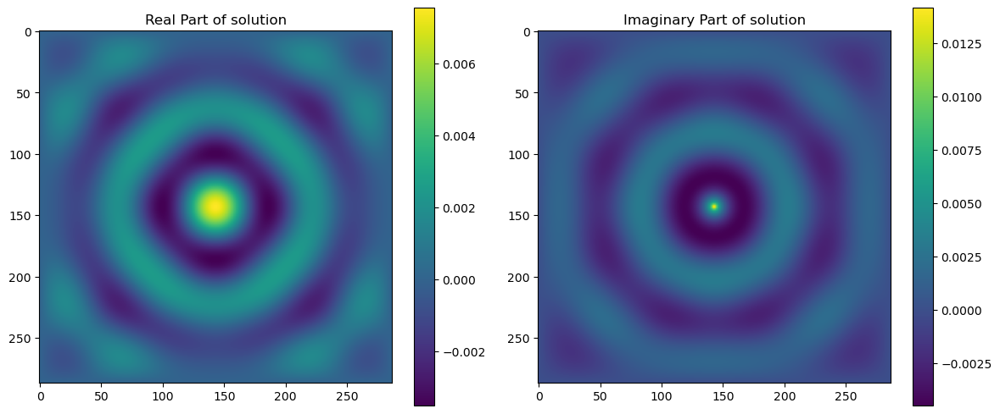

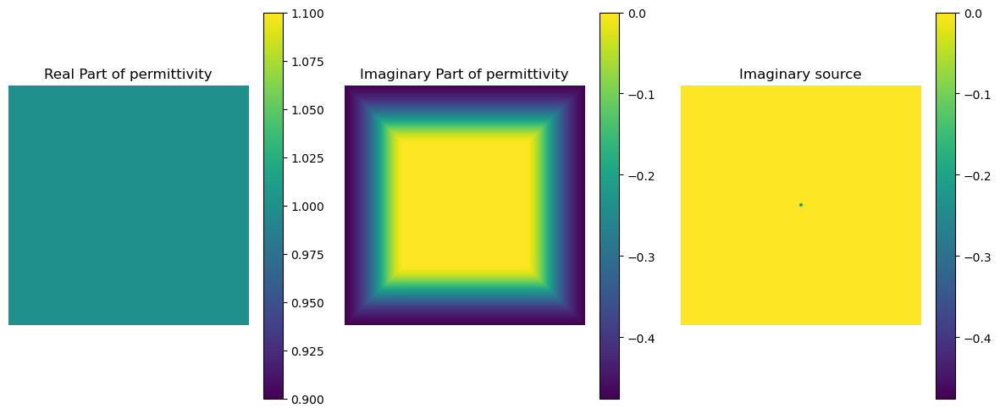

In [8]:
import scipy.io as io

mat_data = io.loadmat('siren_data_v2.mat')

import matplotlib.pyplot as plt

# Create the plot of solved Helmholtz using grid solver
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

im0 = axes[0].imshow(mat_data['Ereal'], cmap='viridis')
axes[0].set_title('Real Part of solution')
#axes[0].axis('off')
plt.colorbar(im0, ax=axes[0])

im1 = axes[1].imshow(mat_data['Eimag'], cmap='viridis')
axes[1].set_title('Imaginary Part of solution')
#axes[1].axis('off')
plt.colorbar(im1, ax=axes[1])

plt.tight_layout()
plt.show()

# Create the plot of input parameters
fig, axes = plt.subplots(1, 3, figsize=(12, 5))

im0 = axes[0].imshow(mat_data['eps_real'], cmap='viridis')
axes[0].set_title('Real Part of permittivity')
axes[0].axis('off')
plt.colorbar(im0, ax=axes[0])

im1 = axes[1].imshow(mat_data['eps_imag'], cmap='viridis')
axes[1].set_title('Imaginary Part of permittivity')
axes[1].axis('off')
plt.colorbar(im1, ax=axes[1])

im2 = axes[2].imshow(mat_data['S'], cmap='viridis')
axes[2].set_title('Imaginary source')
axes[2].axis('off')
plt.colorbar(im1, ax=axes[2])

plt.tight_layout()
plt.show()

#### Train the siren model

Loading checkpoint from ./checkpoints2/model_step_15300.pth
Resuming from step 15300
Previous loss: 7.381612e+03
Step 15300, Total loss 436204.287329, iteration time 3.975409
Checkpoint saved at step 15300


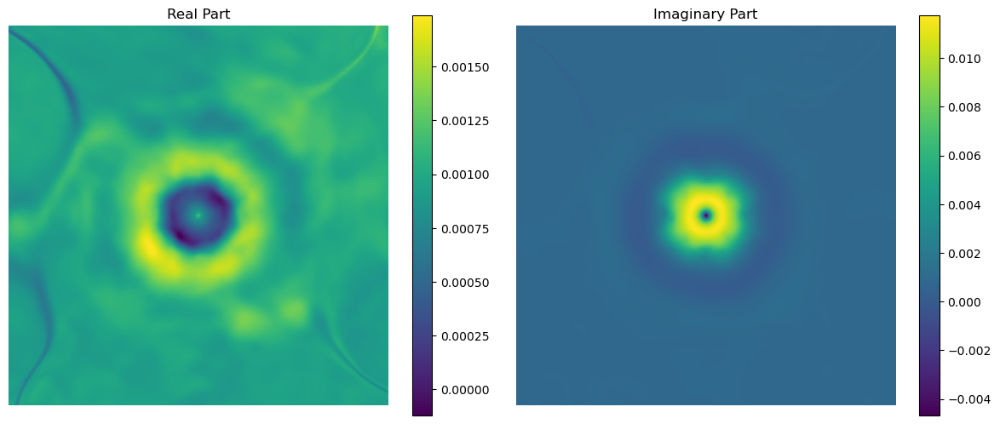

Step 15310, Total loss 285739.852960, iteration time 3.673421
Step 15320, Total loss 331032.925059, iteration time 3.717166
Step 15330, Total loss 286006.604047, iteration time 3.659876
Step 15340, Total loss 226962.968603, iteration time 3.661660
Step 15350, Total loss 225505.149572, iteration time 3.536381
Step 15360, Total loss 317970.639334, iteration time 3.643613
Step 15370, Total loss 219193.610405, iteration time 3.607642
Step 15380, Total loss 219299.782626, iteration time 3.754343
Step 15390, Total loss 399692.212139, iteration time 3.704716
Step 15400, Total loss 341433.416018, iteration time 3.654209
Checkpoint saved at step 15400


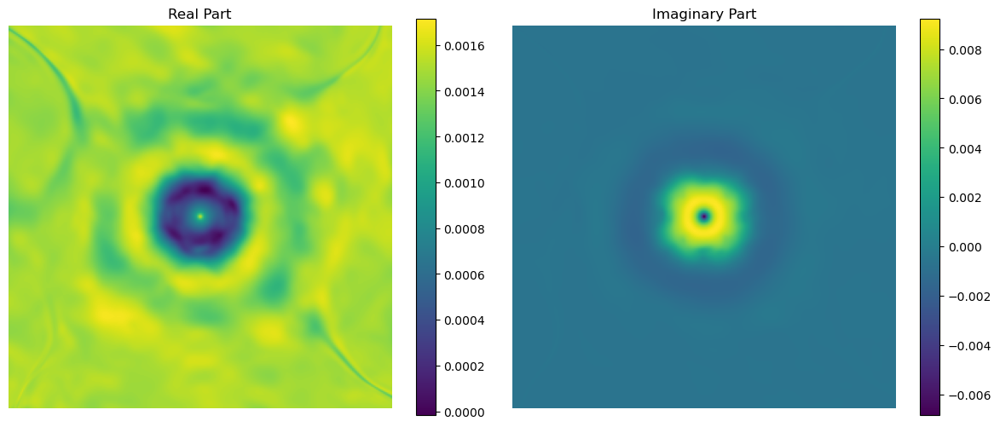

Step 15410, Total loss 209975.370211, iteration time 3.658238
Step 15420, Total loss 225672.987272, iteration time 3.749911
Step 15430, Total loss 292152.497668, iteration time 3.608459
Step 15440, Total loss 182756.200255, iteration time 3.649105
Step 15450, Total loss 210682.428266, iteration time 3.707156
Step 15460, Total loss 313398.502722, iteration time 3.639138
Step 15470, Total loss 175141.758179, iteration time 3.660124
Step 15480, Total loss 186172.237254, iteration time 3.664299
Step 15490, Total loss 174746.034926, iteration time 3.704797
Step 15500, Total loss 310740.501489, iteration time 3.675560
Checkpoint saved at step 15500


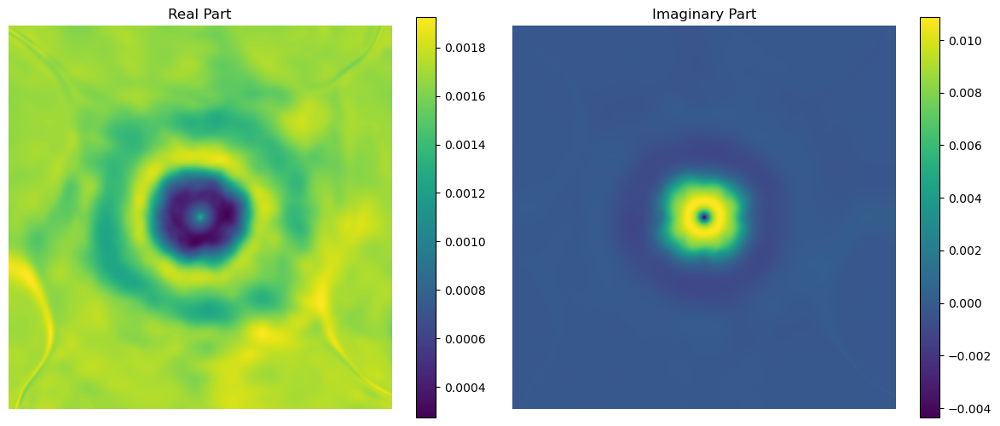

Step 15510, Total loss 244557.824528, iteration time 3.773124
Step 15520, Total loss 261752.734641, iteration time 3.714321
Step 15530, Total loss 200150.541912, iteration time 3.674725
Step 15540, Total loss 260808.702250, iteration time 3.651660
Step 15550, Total loss 332476.173164, iteration time 3.650289
Step 15560, Total loss 339007.998880, iteration time 3.599218
Step 15570, Total loss 269377.855027, iteration time 3.677638
Step 15580, Total loss 279074.940642, iteration time 3.655493
Step 15590, Total loss 308790.996738, iteration time 3.703972
Step 15600, Total loss 375535.556166, iteration time 3.659229
Checkpoint saved at step 15600


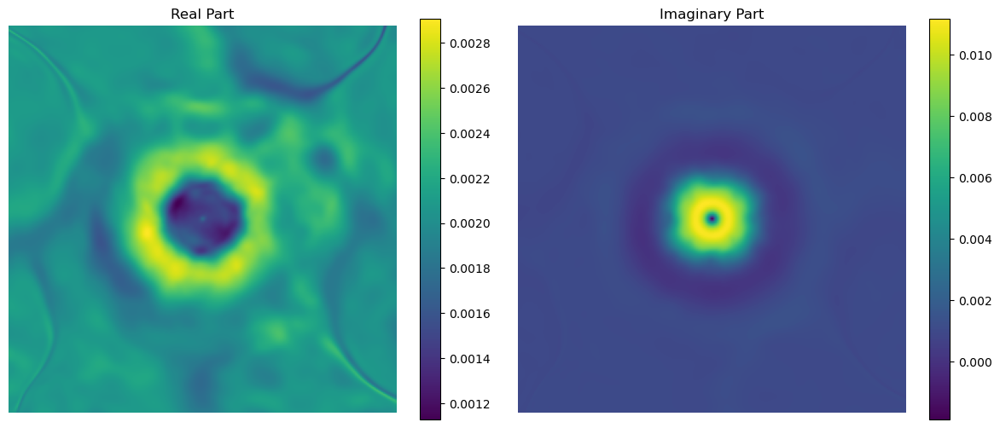

Step 15610, Total loss 241742.841679, iteration time 3.662432
Step 15620, Total loss 300495.433766, iteration time 3.586091
Step 15630, Total loss 223006.656258, iteration time 3.571573
Step 15670, Total loss 321285.324497, iteration time 3.642865
Step 15680, Total loss 195827.928145, iteration time 3.601171
Step 15690, Total loss 291883.877703, iteration time 3.596669
Step 15700, Total loss 364003.423065, iteration time 3.635762
Checkpoint saved at step 15700


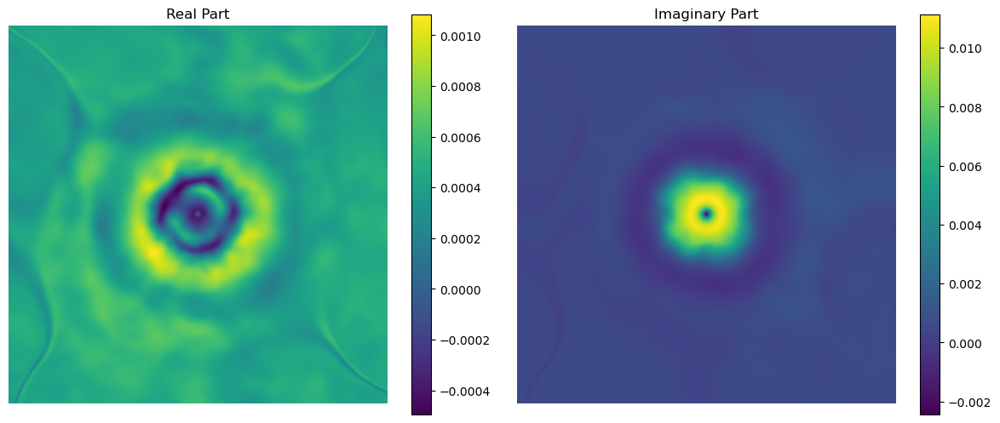

Step 15710, Total loss 236886.067264, iteration time 3.616595
Step 15720, Total loss 250540.494576, iteration time 3.633029
Step 15730, Total loss 283223.697735, iteration time 3.588417
Step 15740, Total loss 367037.697766, iteration time 3.573216
Step 15750, Total loss 249512.105074, iteration time 3.575263
Step 15760, Total loss 275240.327845, iteration time 3.708961
Step 15770, Total loss 226279.218405, iteration time 3.563603
Step 15780, Total loss 280117.476301, iteration time 3.697033
Step 15790, Total loss 231838.484231, iteration time 3.571349
Step 15800, Total loss 154354.346857, iteration time 3.740640
Checkpoint saved at step 15800


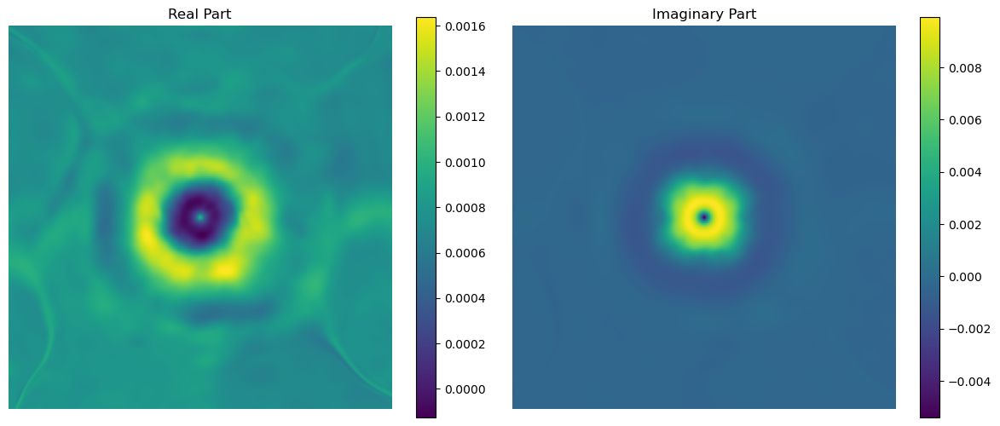

Step 15810, Total loss 490891.058734, iteration time 3.599833
Step 15820, Total loss 307804.986040, iteration time 3.590288
Step 15830, Total loss 276482.651937, iteration time 3.607443
Step 15840, Total loss 164803.731408, iteration time 3.668952
Step 15850, Total loss 287006.541797, iteration time 3.576113
Step 15860, Total loss 320426.744577, iteration time 3.598711
Step 15870, Total loss 241550.171922, iteration time 3.596035
Step 15880, Total loss 304446.828081, iteration time 3.612072
Step 15890, Total loss 262931.179343, iteration time 3.594950
Step 15900, Total loss 155042.395730, iteration time 3.563484
Checkpoint saved at step 15900


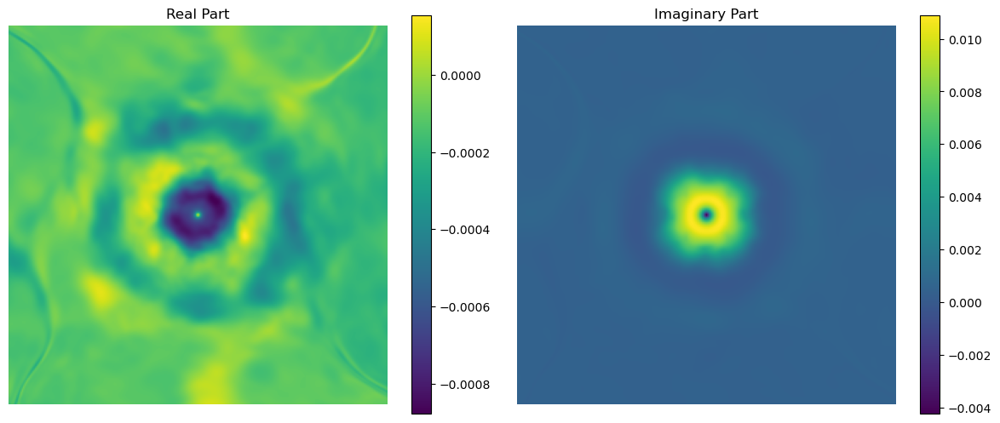

Step 15910, Total loss 237486.341592, iteration time 3.591002
Step 15920, Total loss 242215.987140, iteration time 3.663996
Step 15930, Total loss 224348.081676, iteration time 3.619698
Step 15940, Total loss 235083.525244, iteration time 3.596797
Step 15950, Total loss 251059.811626, iteration time 3.606467
Step 15960, Total loss 305713.257176, iteration time 3.649429
Step 15970, Total loss 282329.975026, iteration time 3.778837
Step 15980, Total loss 341124.909416, iteration time 3.671921
Step 15990, Total loss 209140.003853, iteration time 3.671835
Step 16000, Total loss 279217.163695, iteration time 3.685014
Checkpoint saved at step 16000


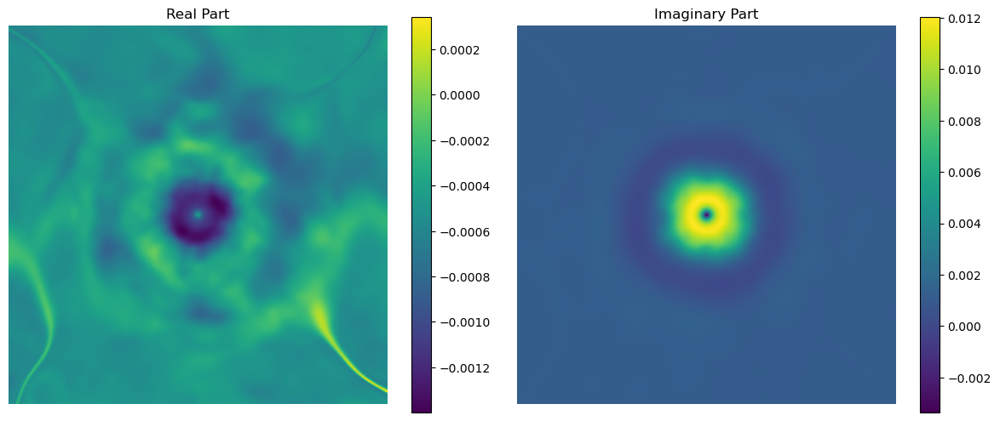

Step 16010, Total loss 209442.010011, iteration time 3.665426
Step 16020, Total loss 233490.692576, iteration time 3.694483
Step 16030, Total loss 382193.070960, iteration time 3.582961
Step 16040, Total loss 266464.059493, iteration time 3.622457
Step 16070, Total loss 295122.556575, iteration time 3.660311
Step 16080, Total loss 240033.545001, iteration time 3.549319
Step 16090, Total loss 358442.437698, iteration time 3.667110
Step 16100, Total loss 212095.191306, iteration time 3.680500
Checkpoint saved at step 16100


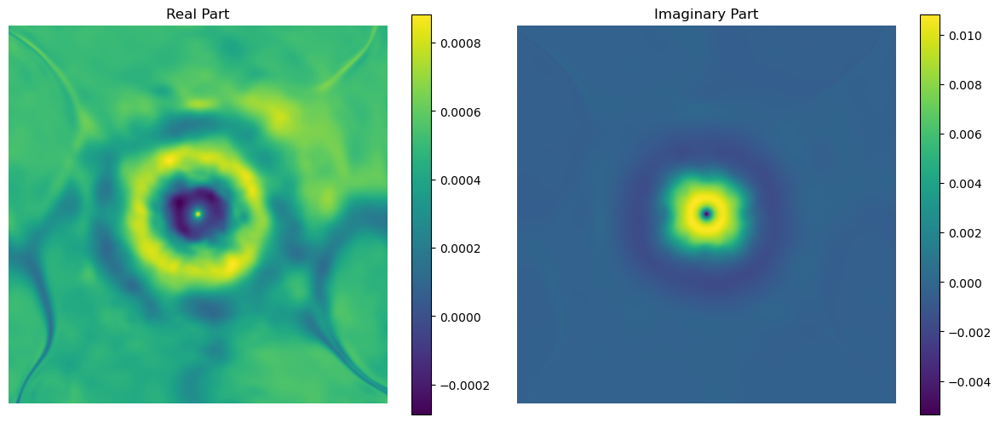

Step 16110, Total loss 419200.883983, iteration time 3.578431
Step 16120, Total loss 262952.260903, iteration time 3.638257
Step 16130, Total loss 247699.624029, iteration time 3.594784
Step 16140, Total loss 215428.084776, iteration time 3.692125
Step 16150, Total loss 287951.367448, iteration time 3.629364
Step 16160, Total loss 228198.733179, iteration time 3.628894
Step 16170, Total loss 211449.337722, iteration time 3.621279
Step 16180, Total loss 241683.863812, iteration time 3.622808
Step 16190, Total loss 386169.467176, iteration time 3.638690
Step 16200, Total loss 355704.567138, iteration time 3.621827
Checkpoint saved at step 16200


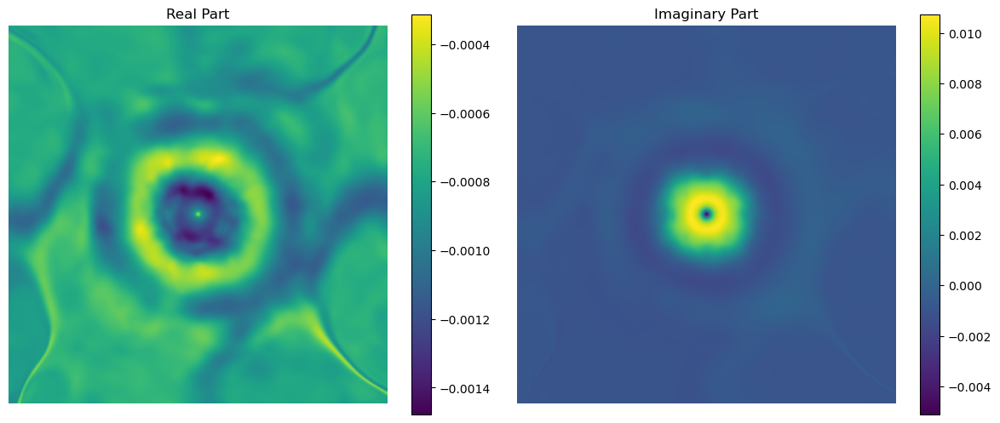

Step 16210, Total loss 235072.918520, iteration time 3.656067
Step 16220, Total loss 290730.742859, iteration time 3.668460
Step 16230, Total loss 180982.251689, iteration time 3.640649
Step 16240, Total loss 267285.556056, iteration time 3.567745
Step 16250, Total loss 331139.293330, iteration time 3.583542
Step 16260, Total loss 275946.920057, iteration time 3.787442
Step 16270, Total loss 277487.521562, iteration time 3.609328
Step 16280, Total loss 224347.045854, iteration time 3.584816
Step 16290, Total loss 212088.429080, iteration time 3.655243
Step 16300, Total loss 408640.918162, iteration time 3.587857
Checkpoint saved at step 16300


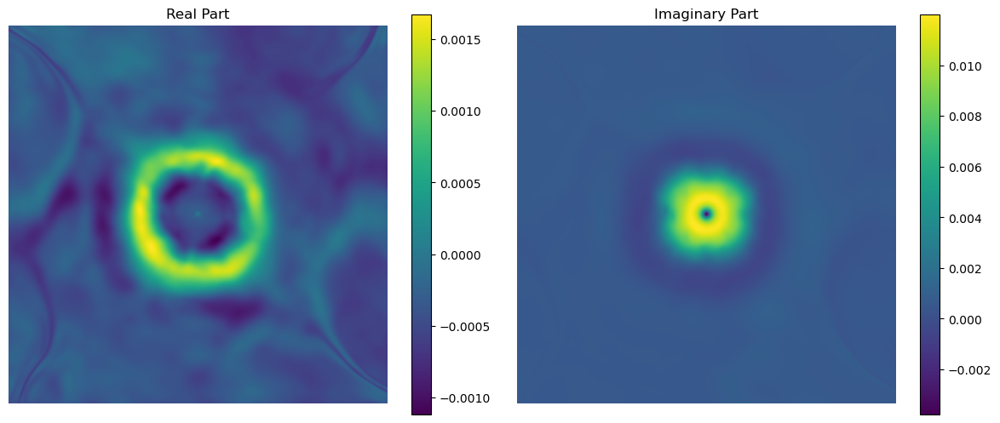

Step 16310, Total loss 256092.028740, iteration time 3.646370
Step 16320, Total loss 226785.483130, iteration time 3.644914
Step 16330, Total loss 249444.829677, iteration time 3.624039
Step 16340, Total loss 272499.647396, iteration time 3.654332
Step 16350, Total loss 222783.013474, iteration time 3.692740
Step 16360, Total loss 203396.551952, iteration time 3.626073
Step 16370, Total loss 222720.558483, iteration time 3.606732
Step 16400, Total loss 263468.922043, iteration time 3.374982
Checkpoint saved at step 16400


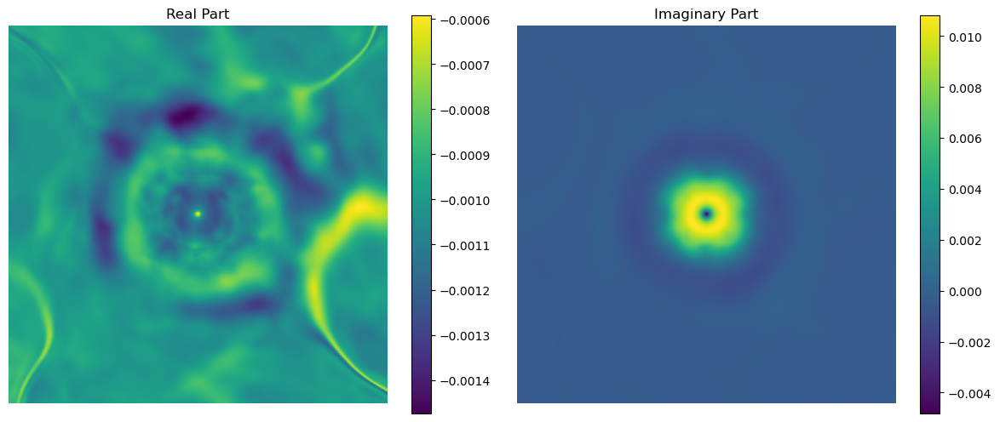

Step 16410, Total loss 198356.051081, iteration time 3.520761
Step 16420, Total loss 172007.477982, iteration time 3.582923
Step 16430, Total loss 360648.850774, iteration time 3.642768
Step 16440, Total loss 289966.214977, iteration time 3.553475
Step 16450, Total loss 365010.575214, iteration time 3.612066
Step 16460, Total loss 217178.093571, iteration time 3.550350
Step 16470, Total loss 322302.595354, iteration time 3.643672
Step 16480, Total loss 258527.053130, iteration time 3.536846
Step 16490, Total loss 230391.065627, iteration time 3.682768
Step 16500, Total loss 278034.867429, iteration time 3.606855
Checkpoint saved at step 16500


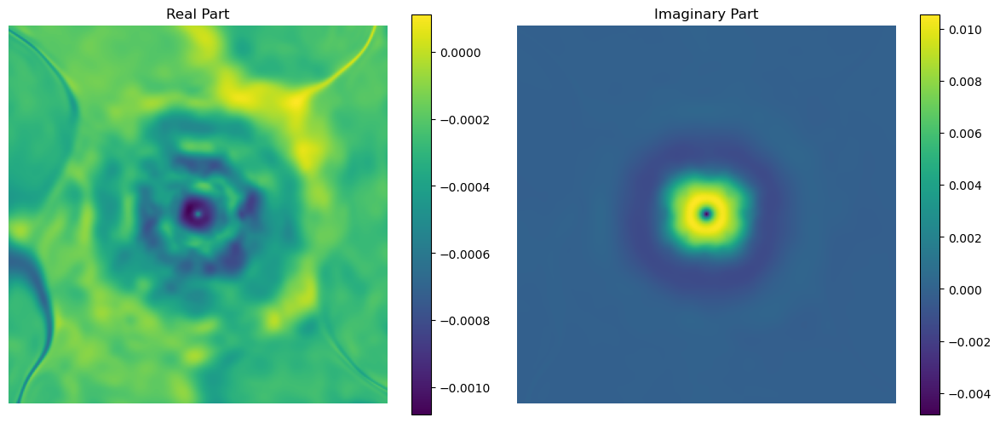

Step 16510, Total loss 203329.163780, iteration time 3.686071
Step 16520, Total loss 372333.086183, iteration time 3.644361
Step 16530, Total loss 232100.491778, iteration time 3.574957
Step 16570, Total loss 182696.334828, iteration time 3.604698
Step 16580, Total loss 170180.761558, iteration time 3.655016
Step 16590, Total loss 208935.011404, iteration time 3.712173
Step 16600, Total loss 304264.637621, iteration time 3.576343
Checkpoint saved at step 16600


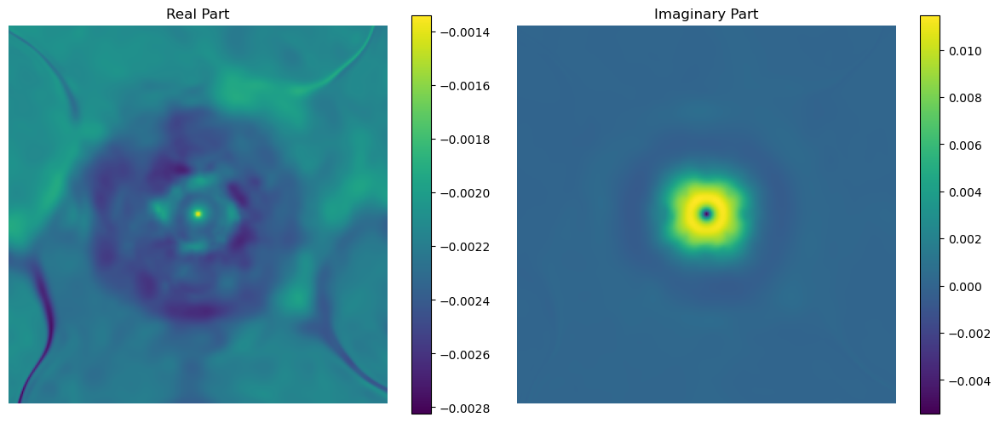

Step 16610, Total loss 264371.292385, iteration time 3.705047
Step 16620, Total loss 181170.958252, iteration time 3.636168
Step 16630, Total loss 211654.715290, iteration time 3.600992
Step 16640, Total loss 342811.695577, iteration time 3.566466
Step 16650, Total loss 189186.697277, iteration time 3.585830
Step 16660, Total loss 339498.469138, iteration time 3.673600
Step 16670, Total loss 253366.864843, iteration time 3.642636
Step 16680, Total loss 289827.085548, iteration time 3.566606
Step 16690, Total loss 333754.230668, iteration time 3.640747
Step 16700, Total loss 196937.944232, iteration time 3.561821
Checkpoint saved at step 16700


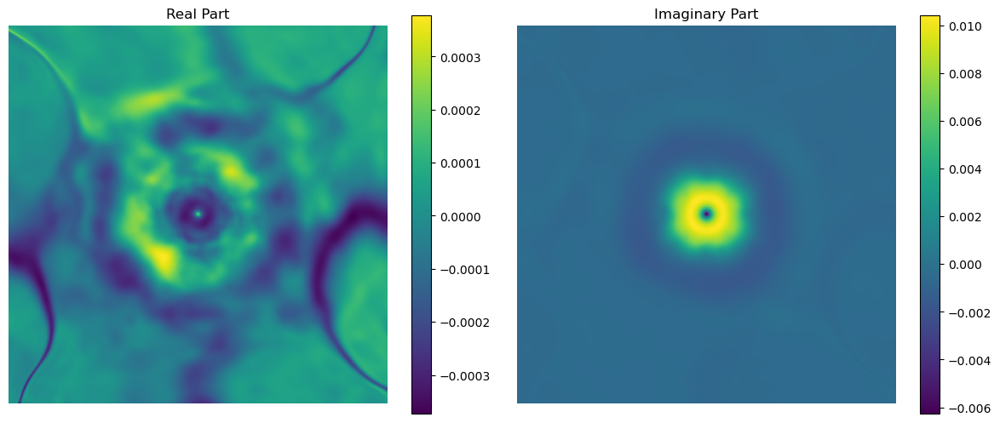

Step 16710, Total loss 189662.448874, iteration time 3.570180
Step 16720, Total loss 352096.158225, iteration time 3.643050
Step 16730, Total loss 303308.798162, iteration time 3.684439
Step 16740, Total loss 482170.079711, iteration time 3.568860
Step 16750, Total loss 374215.675504, iteration time 3.557678
Step 16760, Total loss 276020.306771, iteration time 3.573433
Step 16770, Total loss 232619.567031, iteration time 3.595386
Step 16780, Total loss 220823.018395, iteration time 3.650474
Step 16790, Total loss 217865.575566, iteration time 3.564170
Step 16800, Total loss 217081.134961, iteration time 3.592052
Checkpoint saved at step 16800


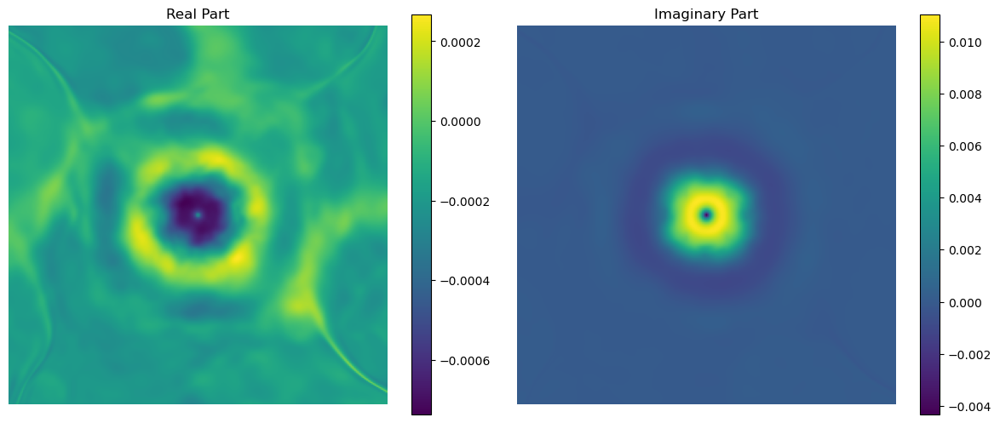

Step 16840, Total loss 233596.140020, iteration time 3.557774
Step 16850, Total loss 227152.460018, iteration time 3.562865
Step 16860, Total loss 349088.540568, iteration time 3.636123
Step 16870, Total loss 351142.559698, iteration time 3.653843
Step 16880, Total loss 445598.052717, iteration time 3.553826
Step 16890, Total loss 199990.499952, iteration time 3.645958
Step 16900, Total loss 323907.522261, iteration time 3.595950
Checkpoint saved at step 16900


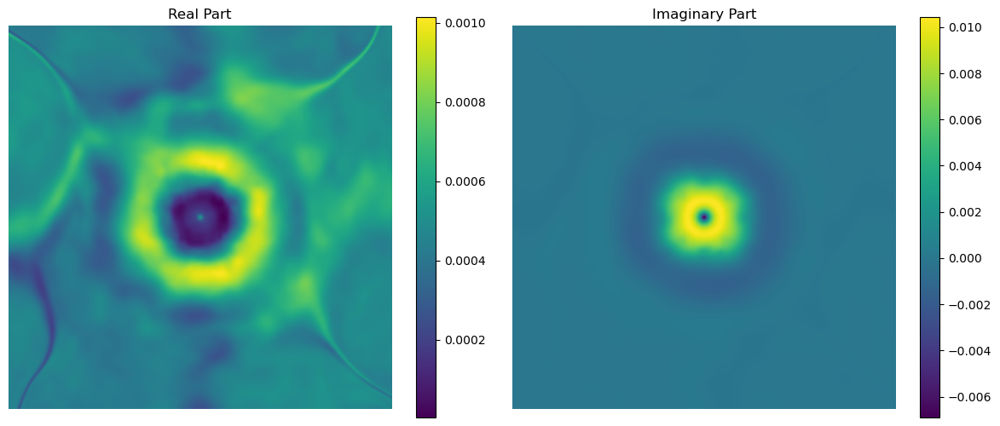

Step 16910, Total loss 219447.463960, iteration time 3.595640
Step 16920, Total loss 320709.605094, iteration time 3.591369
Step 16930, Total loss 293097.247000, iteration time 3.704581
Step 16940, Total loss 262963.737235, iteration time 3.745847
Step 16950, Total loss 326956.793085, iteration time 3.603662
Step 16960, Total loss 235164.925690, iteration time 3.585667
Step 16970, Total loss 252468.809615, iteration time 3.599957
Step 16980, Total loss 213121.057033, iteration time 3.671822
Step 16990, Total loss 289614.243403, iteration time 3.696578
Step 17000, Total loss 272424.050307, iteration time 3.708356
Checkpoint saved at step 17000


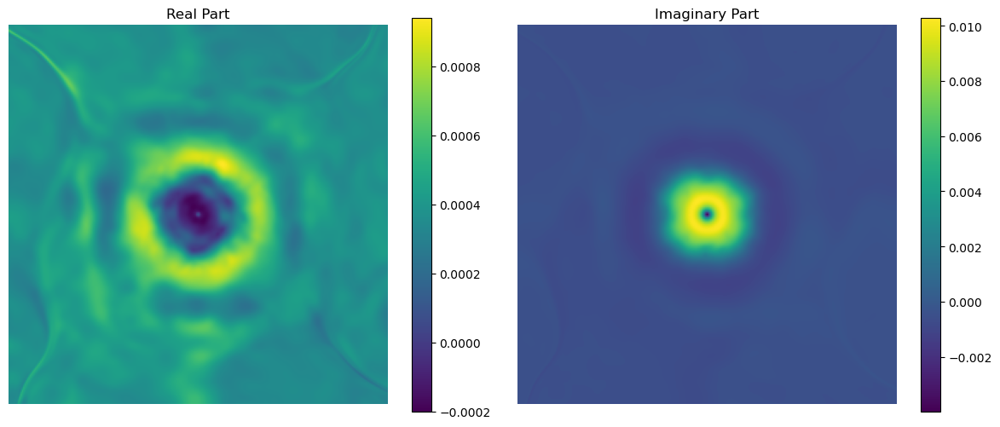

Step 17010, Total loss 230064.334122, iteration time 3.836658
Step 17020, Total loss 225146.583071, iteration time 3.637475
Step 17030, Total loss 215672.545958, iteration time 3.727283
Step 17040, Total loss 303485.748361, iteration time 3.619742
Step 17050, Total loss 201926.000204, iteration time 3.678365
Step 17060, Total loss 163622.934358, iteration time 3.649774
Step 17070, Total loss 316650.858423, iteration time 3.587511
Step 17100, Total loss 197844.761876, iteration time 3.742892
Checkpoint saved at step 17100


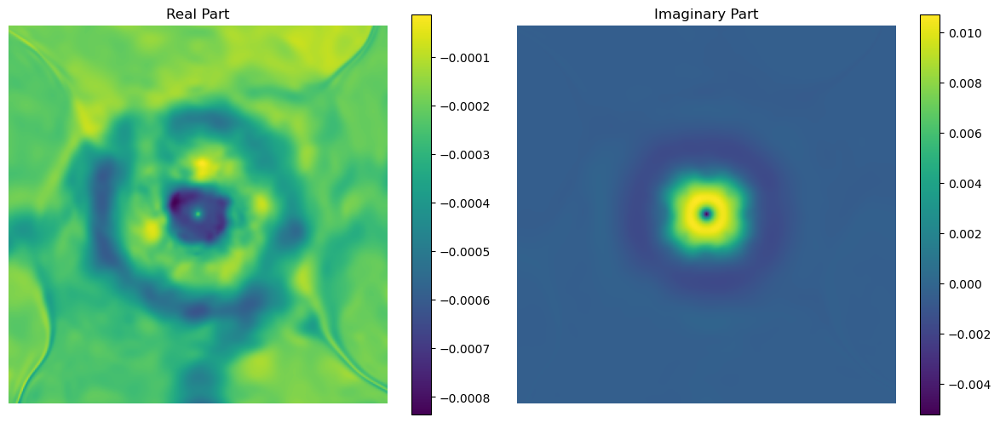

Step 17110, Total loss 294344.632838, iteration time 3.705727
Step 17120, Total loss 209488.540919, iteration time 3.613059
Step 17130, Total loss 154934.969168, iteration time 3.704869
Step 17140, Total loss 353940.660869, iteration time 3.588383
Step 17150, Total loss 171868.398874, iteration time 3.645026
Step 17160, Total loss 359812.175689, iteration time 3.684700
Step 17170, Total loss 294189.433292, iteration time 3.666487
Step 17180, Total loss 300964.841606, iteration time 3.589119
Step 17190, Total loss 205856.106666, iteration time 3.672232
Step 17200, Total loss 274347.215768, iteration time 3.705529
Checkpoint saved at step 17200


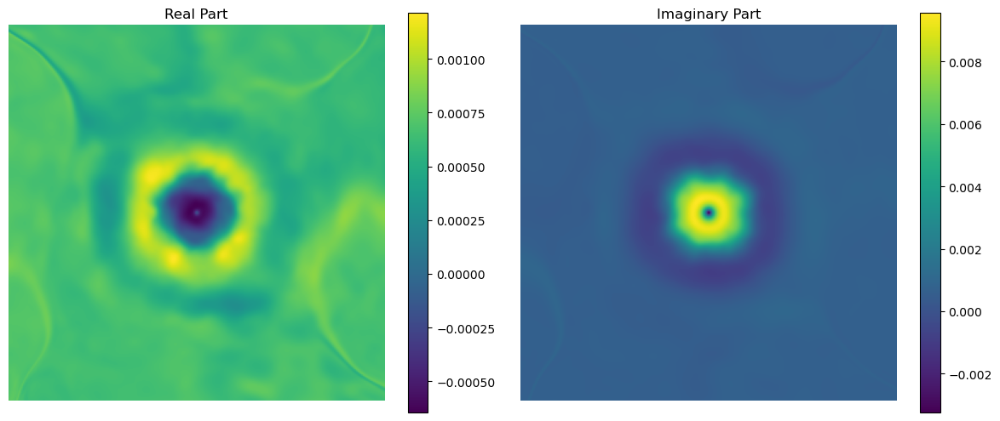

Step 17210, Total loss 210236.085605, iteration time 3.618952
Step 17220, Total loss 202803.796216, iteration time 3.590477
Step 17230, Total loss 214685.092924, iteration time 3.660217
Step 17240, Total loss 242918.054173, iteration time 3.589093
Step 17250, Total loss 256127.386713, iteration time 3.677225
Step 17260, Total loss 280167.415804, iteration time 3.558711
Step 17270, Total loss 227856.271745, iteration time 3.663595
Step 17280, Total loss 232545.926357, iteration time 3.660534
Step 17290, Total loss 268327.158313, iteration time 3.581724
Step 17300, Total loss 205484.551572, iteration time 3.626776
Checkpoint saved at step 17300


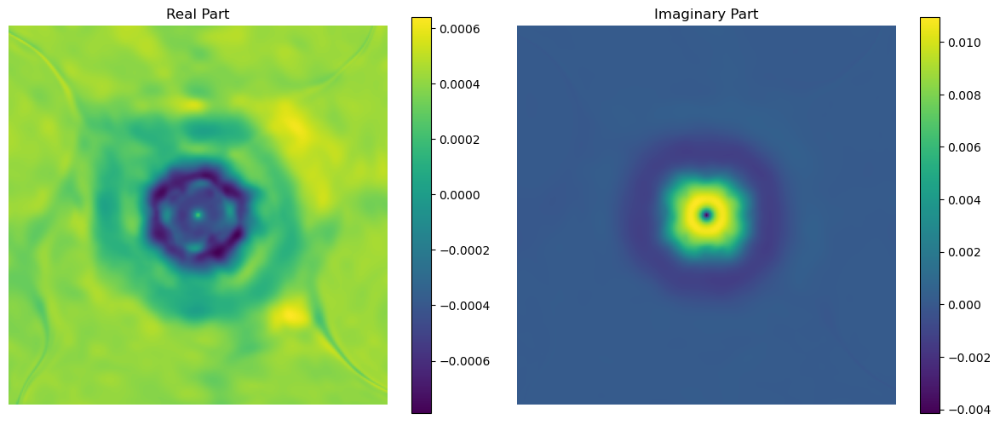

Step 17310, Total loss 331304.433939, iteration time 3.586566
Step 17320, Total loss 301587.578622, iteration time 3.587547
Step 17330, Total loss 264353.158356, iteration time 3.637069
Step 17340, Total loss 261660.769323, iteration time 3.567311
Step 17350, Total loss 216211.217972, iteration time 3.584120
Step 17360, Total loss 236583.870177, iteration time 3.673945
Step 17370, Total loss 209053.937049, iteration time 3.742481
Step 17380, Total loss 270673.091870, iteration time 3.636011
Step 17390, Total loss 214713.724444, iteration time 3.739253
Step 17400, Total loss 245823.662722, iteration time 3.614203
Checkpoint saved at step 17400


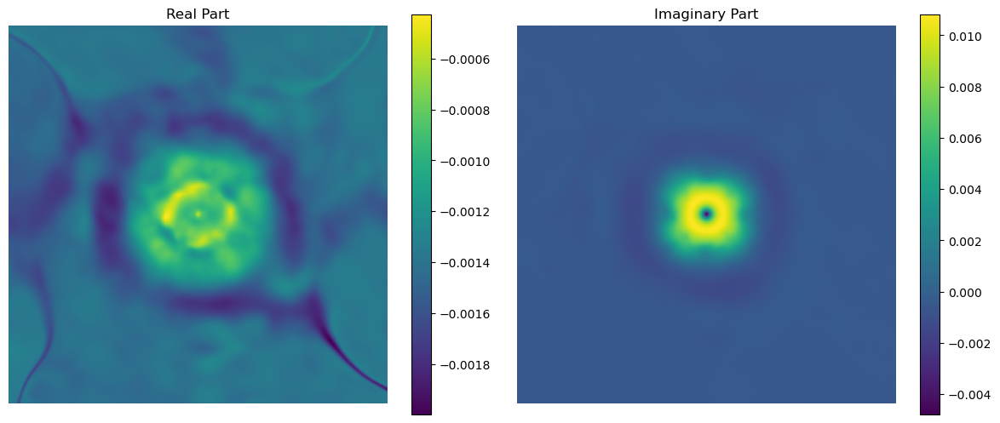

Step 17410, Total loss 211609.127263, iteration time 3.728328
Step 17420, Total loss 243347.690390, iteration time 3.570720
Step 17430, Total loss 209566.175418, iteration time 3.689700
Step 17440, Total loss 254288.506257, iteration time 3.693522
Step 17480, Total loss 239934.591326, iteration time 3.658591
Step 17490, Total loss 188607.612811, iteration time 3.672026
Step 17500, Total loss 200773.287442, iteration time 3.727201
Checkpoint saved at step 17500


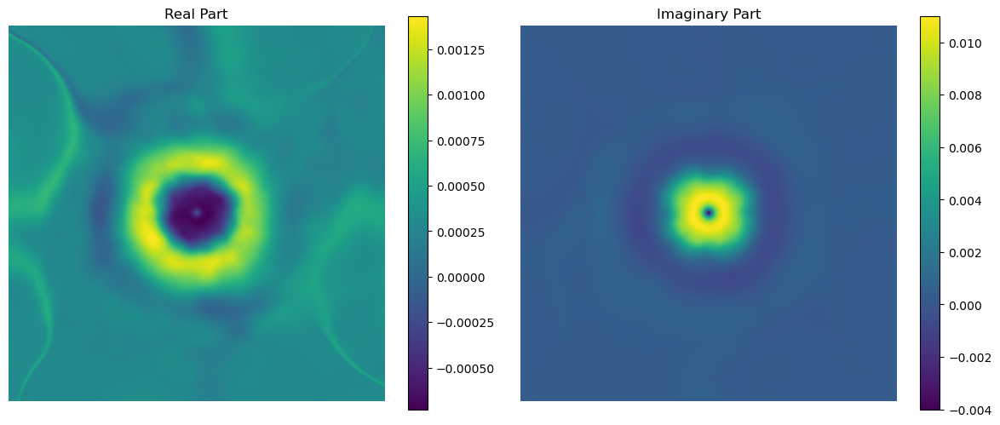

Step 17510, Total loss 177102.966960, iteration time 3.605220
Step 17520, Total loss 201814.088653, iteration time 3.589114
Step 17530, Total loss 219966.531023, iteration time 3.636191
Step 17540, Total loss 330235.507519, iteration time 3.599193
Step 17550, Total loss 233825.004422, iteration time 3.689662
Step 17560, Total loss 389255.413976, iteration time 3.647838
Step 17570, Total loss 162367.901117, iteration time 3.631879
Step 17580, Total loss 249428.828630, iteration time 3.722126
Step 17590, Total loss 271707.847396, iteration time 3.650856
Step 17600, Total loss 229961.091954, iteration time 3.657813
Checkpoint saved at step 17600


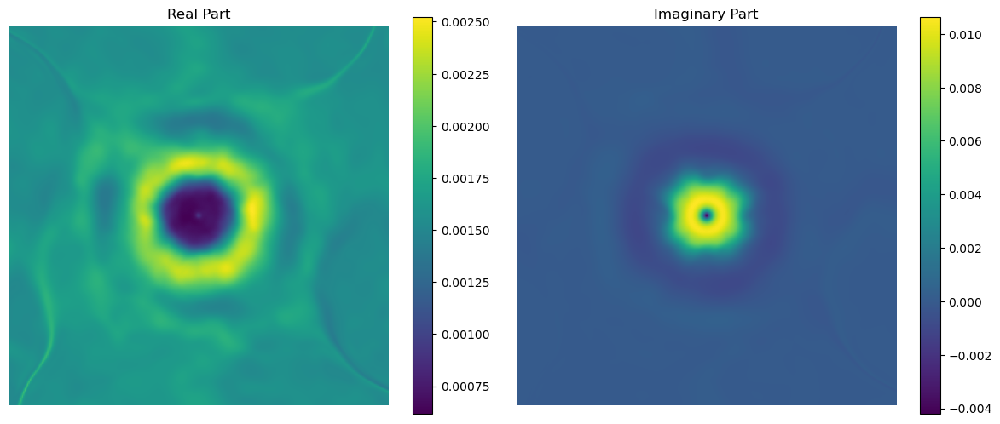

Step 17610, Total loss 201716.100394, iteration time 3.611992
Step 17620, Total loss 279452.448175, iteration time 3.633652
Step 17630, Total loss 273226.959132, iteration time 3.687833
Step 17640, Total loss 214556.623677, iteration time 3.679453
Step 17650, Total loss 187138.276213, iteration time 3.702997
Step 17660, Total loss 279355.388281, iteration time 3.689640
Step 17670, Total loss 350964.555606, iteration time 3.586958
Step 17680, Total loss 164256.365538, iteration time 3.575862
Step 17690, Total loss 278341.345858, iteration time 3.628237
Step 17700, Total loss 194839.581337, iteration time 3.623263
Checkpoint saved at step 17700


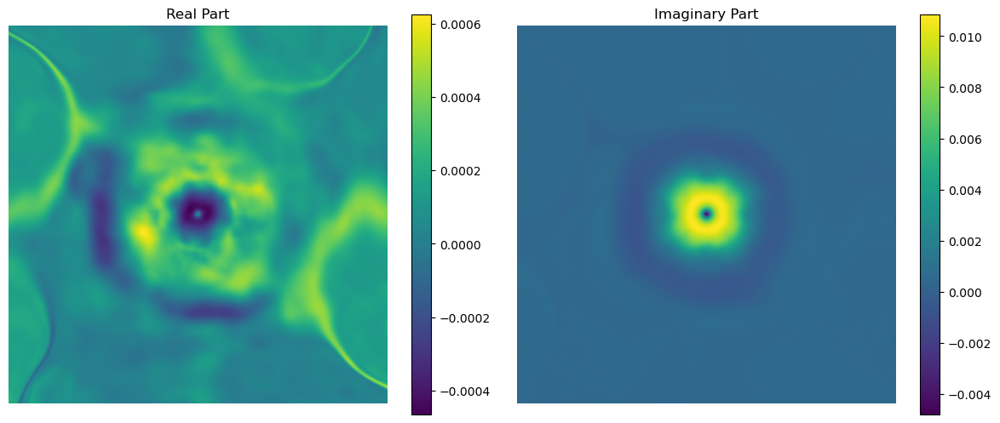

Step 17730, Total loss 237116.173421, iteration time 3.673263
Step 17740, Total loss 204960.241599, iteration time 3.695666
Step 17750, Total loss 361001.527968, iteration time 3.719781
Step 17760, Total loss 270020.306625, iteration time 3.747780
Step 17770, Total loss 344582.380287, iteration time 3.654586
Step 17780, Total loss 208303.001199, iteration time 3.584274
Step 17790, Total loss 174622.764900, iteration time 3.629617
Step 17800, Total loss 344630.301275, iteration time 3.656007
Checkpoint saved at step 17800


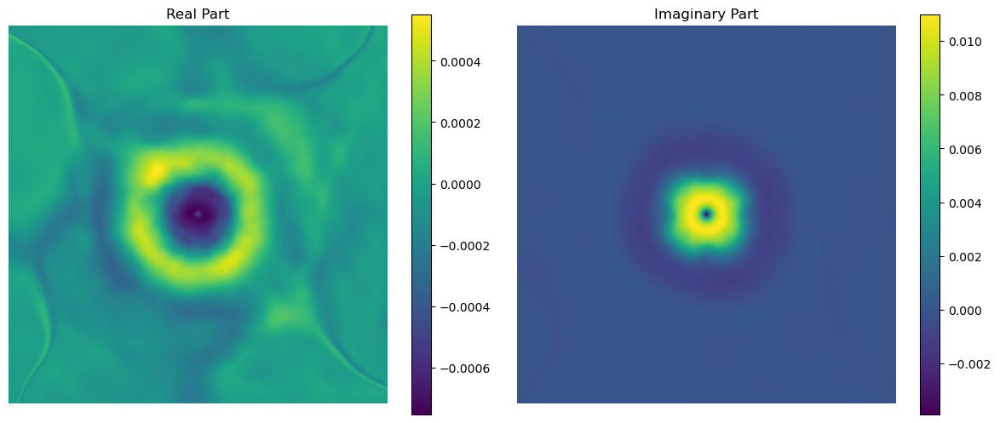

Step 17810, Total loss 359798.221780, iteration time 3.624363
Step 17820, Total loss 156789.535833, iteration time 3.593010
Step 17830, Total loss 348228.803644, iteration time 3.600442
Step 17840, Total loss 211915.930978, iteration time 3.659478
Step 17850, Total loss 199018.986249, iteration time 3.578716
Step 17860, Total loss 291784.210739, iteration time 3.665917
Step 17870, Total loss 338365.069872, iteration time 3.620258
Step 17880, Total loss 192631.995795, iteration time 3.587020
Step 17890, Total loss 238988.099783, iteration time 3.634748
Step 17900, Total loss 210996.992498, iteration time 3.680114
Checkpoint saved at step 17900


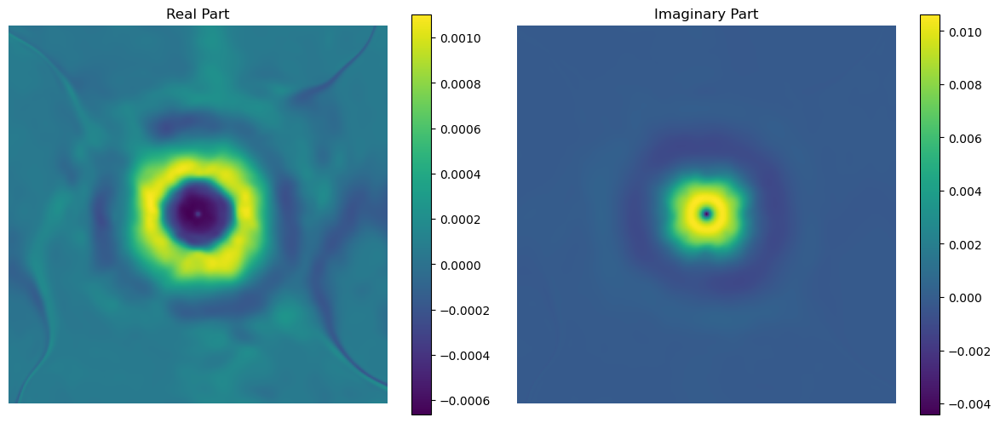

Step 17910, Total loss 238778.540801, iteration time 3.590815
Step 17920, Total loss 226786.987556, iteration time 3.685121
Step 17930, Total loss 204097.855924, iteration time 3.655412
Step 17940, Total loss 492857.826443, iteration time 3.375184
Step 17950, Total loss 262526.612163, iteration time 3.697723
Step 17960, Total loss 383147.538946, iteration time 3.381875
Step 17970, Total loss 256297.975163, iteration time 3.394291
Step 18000, Total loss 300518.886534, iteration time 3.694312
Checkpoint saved at step 18000


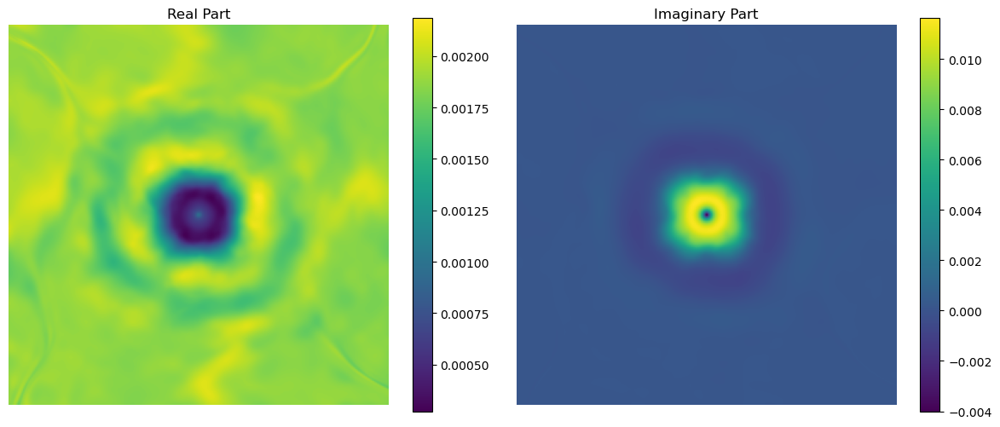

Step 18010, Total loss 432236.946979, iteration time 3.604852
Step 18020, Total loss 243515.279183, iteration time 3.565033
Step 18030, Total loss 262288.969465, iteration time 3.643701
Step 18040, Total loss 322696.033158, iteration time 3.566136
Step 18050, Total loss 186365.140291, iteration time 3.559299
Step 18060, Total loss 189760.930434, iteration time 3.719357
Step 18070, Total loss 262322.449215, iteration time 3.611485
Step 18080, Total loss 241068.979329, iteration time 3.586906
Step 18090, Total loss 239797.177639, iteration time 3.633005
Step 18100, Total loss 280220.923897, iteration time 3.622360
Checkpoint saved at step 18100


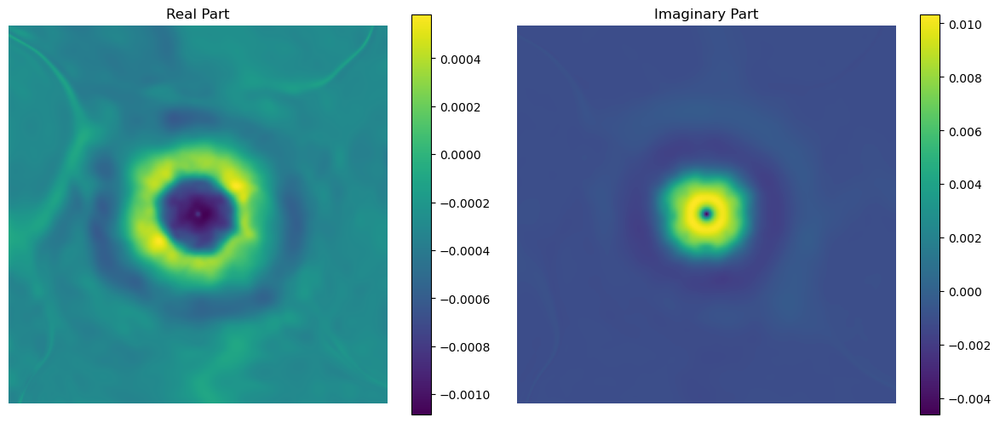

Step 18110, Total loss 244236.514934, iteration time 3.621469
Step 18120, Total loss 204886.557732, iteration time 3.624492
Step 18130, Total loss 280441.425251, iteration time 3.620242
Step 18140, Total loss 375063.102317, iteration time 3.632300
Step 18150, Total loss 276171.360333, iteration time 3.649383
Step 18160, Total loss 225189.250099, iteration time 3.583327
Step 18170, Total loss 327110.302337, iteration time 3.609320
Step 18180, Total loss 194237.617217, iteration time 3.578995
Step 18190, Total loss 178174.987479, iteration time 3.613093
Step 18200, Total loss 219304.880257, iteration time 3.598980
Checkpoint saved at step 18200


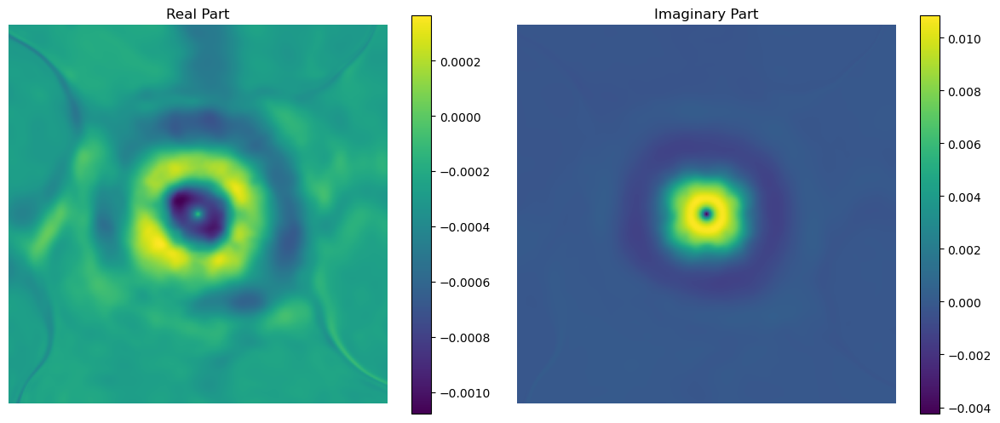

Step 18210, Total loss 235850.553331, iteration time 3.581246
Step 18220, Total loss 319209.196241, iteration time 3.627079
Step 18230, Total loss 398881.928542, iteration time 3.578250
Step 18240, Total loss 254306.283529, iteration time 3.595129
Step 18250, Total loss 269557.496174, iteration time 3.601068
Step 18260, Total loss 217095.919861, iteration time 3.730412
Step 18270, Total loss 243650.310019, iteration time 3.641085
Step 18280, Total loss 199452.127382, iteration time 3.601737
Step 18290, Total loss 205774.812242, iteration time 3.606699
Step 18300, Total loss 189526.302784, iteration time 3.662798
Checkpoint saved at step 18300


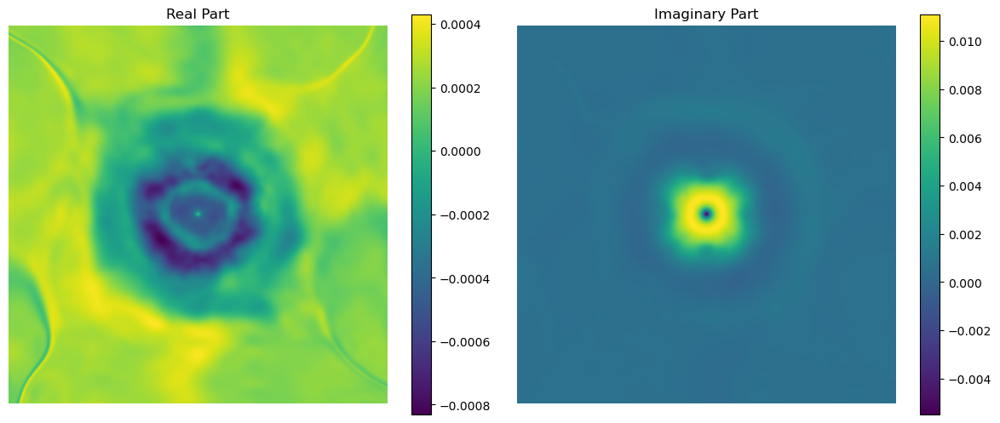

Step 18310, Total loss 189450.362590, iteration time 3.725764
Step 18320, Total loss 327794.333675, iteration time 3.592846
Step 18330, Total loss 180860.552296, iteration time 3.658566
Step 18340, Total loss 237240.862943, iteration time 3.682539
Step 18350, Total loss 203246.005306, iteration time 3.592901
Step 18360, Total loss 205805.717747, iteration time 3.647857
Step 18370, Total loss 242779.266823, iteration time 3.653391
Step 18380, Total loss 196101.432021, iteration time 3.591646
Step 18390, Total loss 277000.200446, iteration time 3.576249
Step 18400, Total loss 194045.091543, iteration time 3.585892
Checkpoint saved at step 18400


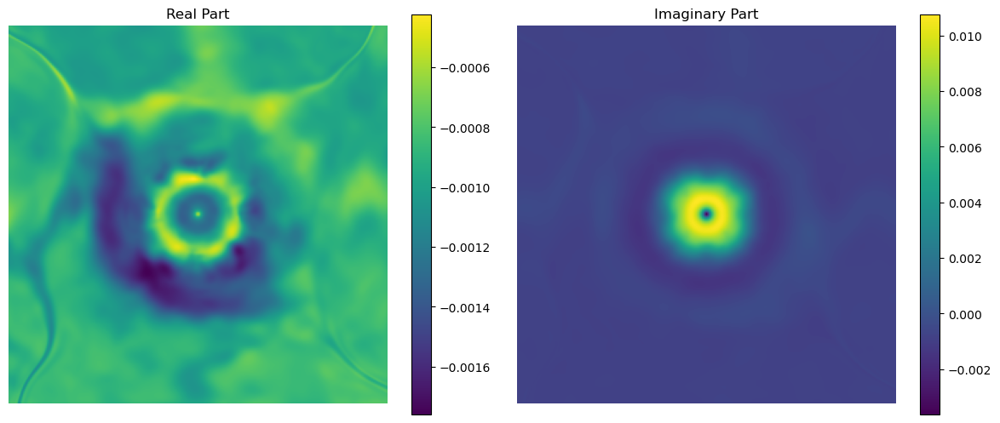

Step 18410, Total loss 226943.470787, iteration time 3.629137
Step 18420, Total loss 328344.498387, iteration time 3.628254
Step 18430, Total loss 311260.185674, iteration time 3.684205
Step 18440, Total loss 308413.525762, iteration time 3.683907
Step 18450, Total loss 393702.813154, iteration time 3.618580
Step 18460, Total loss 236986.543235, iteration time 3.613845
Step 18470, Total loss 379327.049776, iteration time 3.650955
Step 18480, Total loss 184336.653411, iteration time 3.623882
Step 18490, Total loss 176671.042389, iteration time 3.603880
Step 18500, Total loss 242596.332828, iteration time 3.678453
Checkpoint saved at step 18500


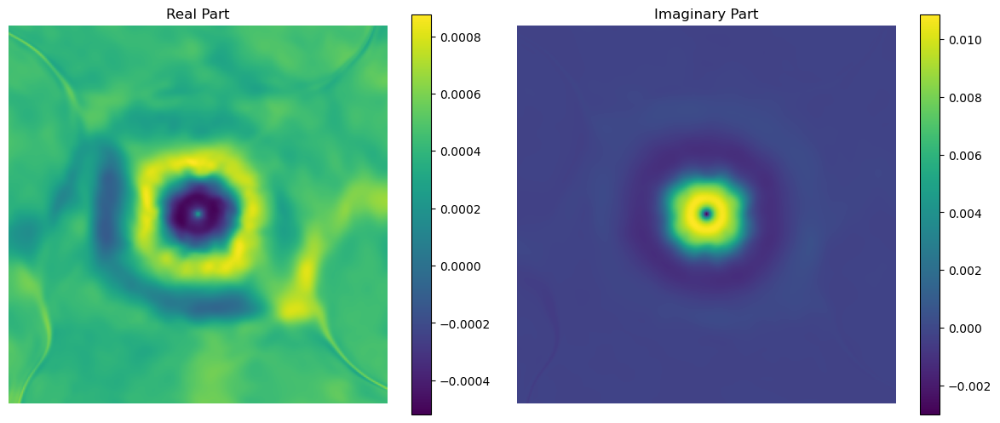

Step 18510, Total loss 217732.326296, iteration time 3.651166
Step 18520, Total loss 243948.233701, iteration time 3.696607
Step 18530, Total loss 317194.250197, iteration time 3.712865
Step 18540, Total loss 366158.910550, iteration time 3.568458
Step 18590, Total loss 377275.574085, iteration time 3.665142
Step 18600, Total loss 207458.878198, iteration time 3.650585
Checkpoint saved at step 18600


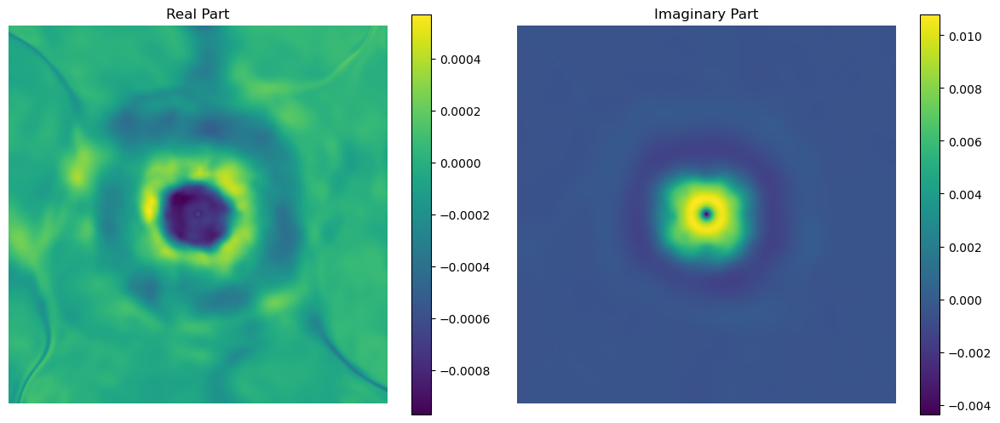

Step 18610, Total loss 332257.891167, iteration time 3.572530
Step 18620, Total loss 194982.115048, iteration time 3.622437
Step 18630, Total loss 245658.139294, iteration time 3.658231
Step 18640, Total loss 193522.415823, iteration time 3.636304
Step 18650, Total loss 237849.687705, iteration time 3.593070
Step 18660, Total loss 292932.503251, iteration time 3.563844
Step 18670, Total loss 234307.417927, iteration time 3.617958
Step 18680, Total loss 369088.769071, iteration time 3.617603
Step 18690, Total loss 222946.350346, iteration time 3.682656
Step 18700, Total loss 290520.103982, iteration time 3.601103
Checkpoint saved at step 18700


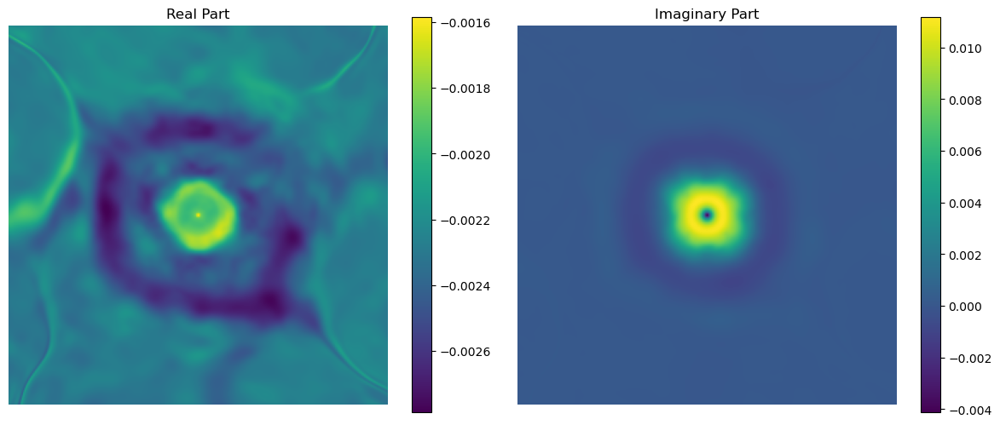

Step 18710, Total loss 144215.847475, iteration time 3.596673
Step 18720, Total loss 248846.347629, iteration time 3.672720
Step 18730, Total loss 236012.307973, iteration time 3.634725
Step 18740, Total loss 312157.595254, iteration time 3.632114
Step 18750, Total loss 209810.867579, iteration time 3.614211
Step 18760, Total loss 212290.580844, iteration time 3.601122
Step 18770, Total loss 331981.510859, iteration time 3.652282
Step 18780, Total loss 296750.632540, iteration time 3.573165
Step 18790, Total loss 343413.410424, iteration time 3.624380
Step 18800, Total loss 262732.382838, iteration time 3.578714
Checkpoint saved at step 18800


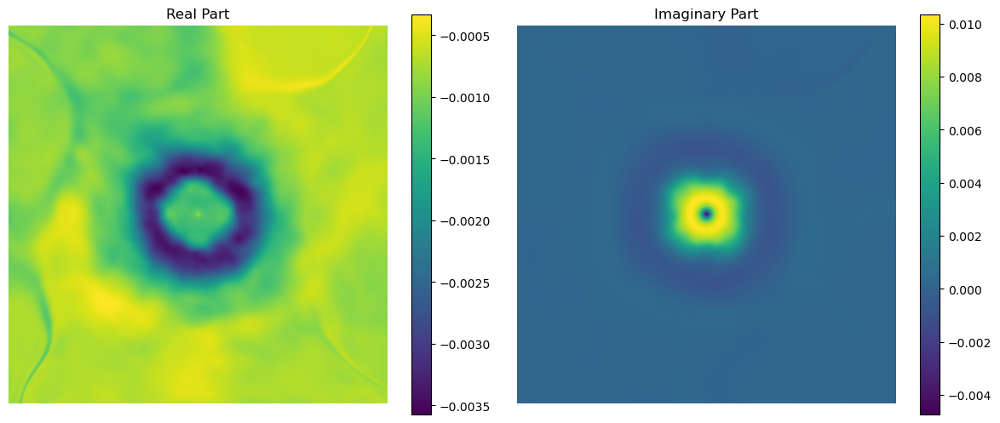

Step 18810, Total loss 224585.751478, iteration time 3.610429
Step 18850, Total loss 205332.210535, iteration time 3.547702
Step 18860, Total loss 192413.857699, iteration time 3.670730
Step 18870, Total loss 144013.305012, iteration time 3.575465
Step 18880, Total loss 287758.647301, iteration time 3.577669
Step 18890, Total loss 217541.771110, iteration time 3.642493
Step 18900, Total loss 223552.287356, iteration time 3.678550
Checkpoint saved at step 18900


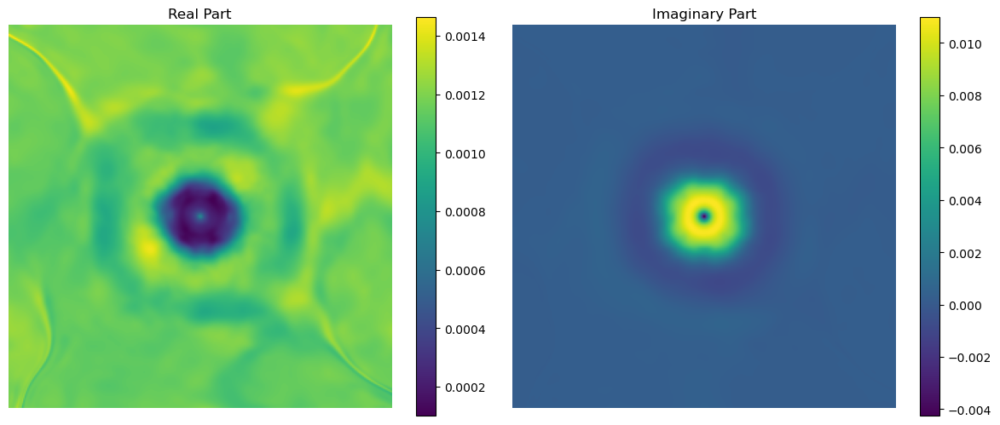

Step 18910, Total loss 350417.140048, iteration time 3.699028
Step 18920, Total loss 223909.563997, iteration time 3.658180
Step 18930, Total loss 305559.591463, iteration time 3.706794
Step 18940, Total loss 269989.032244, iteration time 3.607028
Step 18950, Total loss 205814.969055, iteration time 3.563281
Step 18960, Total loss 208682.757306, iteration time 3.682349
Step 18970, Total loss 196825.187933, iteration time 3.677381
Step 18980, Total loss 206506.453758, iteration time 3.594041
Step 18990, Total loss 216332.176172, iteration time 3.561281
Step 19000, Total loss 258935.034486, iteration time 3.665761
Checkpoint saved at step 19000


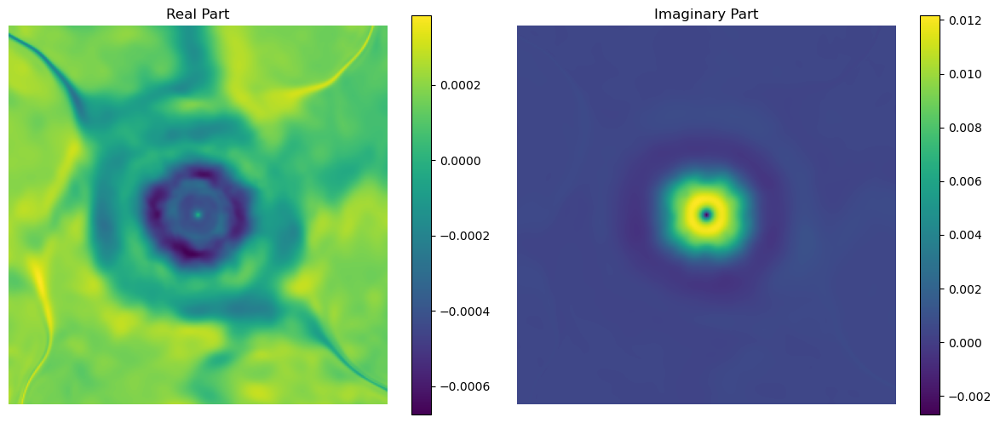

Step 19010, Total loss 203091.188823, iteration time 3.683558
Step 19020, Total loss 252197.725857, iteration time 3.675948
Step 19030, Total loss 205176.166423, iteration time 3.671715
Step 19040, Total loss 238414.083445, iteration time 3.623276
Step 19050, Total loss 453133.890862, iteration time 3.596079
Step 19060, Total loss 383038.587211, iteration time 3.695762
Step 19070, Total loss 326867.119913, iteration time 3.569672
Step 19080, Total loss 226431.619252, iteration time 3.608218
Step 19090, Total loss 196623.609695, iteration time 3.653003
Step 19100, Total loss 328744.940705, iteration time 3.590671
Checkpoint saved at step 19100


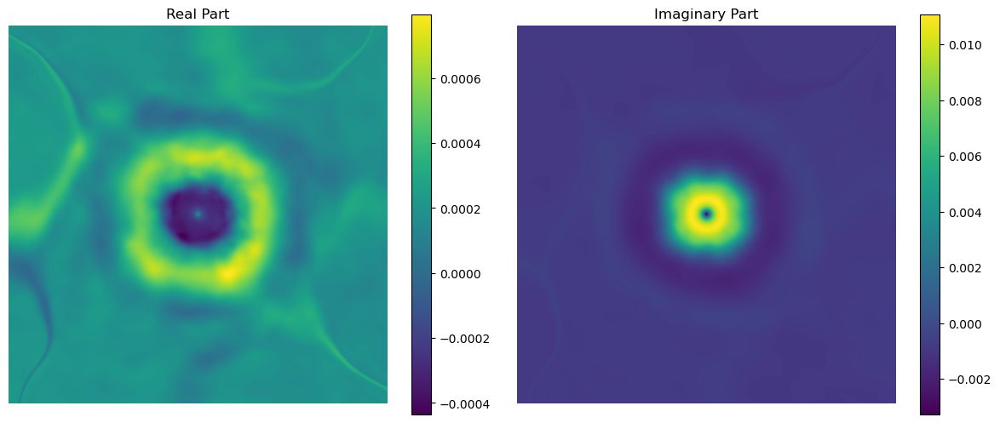

Step 19110, Total loss 170239.158152, iteration time 3.670833
Step 19120, Total loss 343139.498549, iteration time 3.624704
Step 19130, Total loss 172079.933458, iteration time 3.690955
Step 19140, Total loss 229658.795713, iteration time 3.609224
Step 19150, Total loss 185784.535631, iteration time 3.569604
Step 19190, Total loss 275587.019924, iteration time 3.701440
Step 19200, Total loss 295536.427943, iteration time 3.621417
Checkpoint saved at step 19200


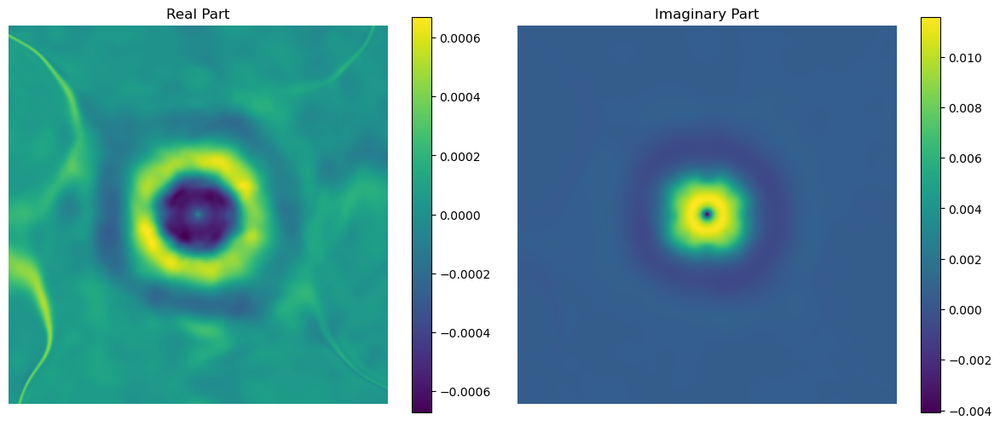

Step 19210, Total loss 177305.256371, iteration time 3.659856
Step 19220, Total loss 354090.398337, iteration time 3.627915
Step 19230, Total loss 195532.260006, iteration time 3.668932
Step 19240, Total loss 195498.954727, iteration time 3.656539
Step 19250, Total loss 157717.917713, iteration time 3.582213
Step 19260, Total loss 209430.200950, iteration time 3.669000
Step 19270, Total loss 228001.154485, iteration time 3.700036
Step 19280, Total loss 220164.841196, iteration time 3.600402
Step 19290, Total loss 226234.469395, iteration time 3.582295
Step 19300, Total loss 234483.029294, iteration time 3.549770
Checkpoint saved at step 19300


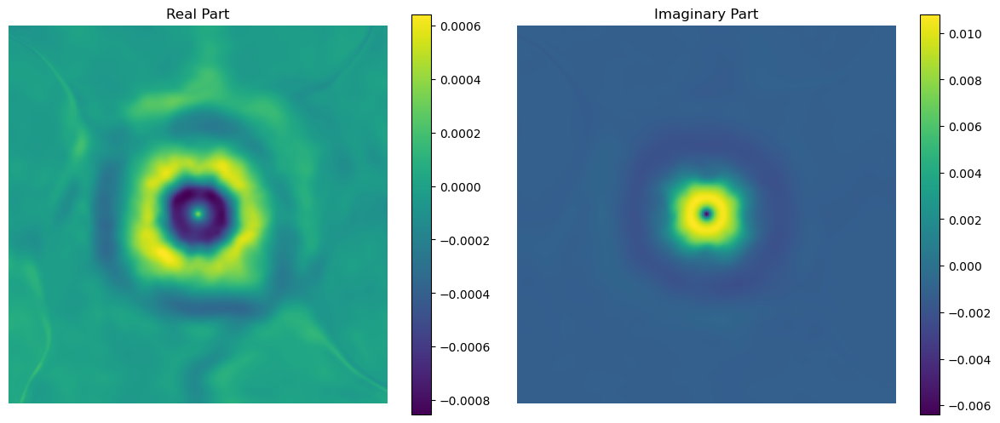

Step 19310, Total loss 181719.616780, iteration time 3.611313
Step 19320, Total loss 233469.640445, iteration time 3.623432
Step 19330, Total loss 216546.586348, iteration time 3.680649
Step 19340, Total loss 228992.804114, iteration time 3.903770
Step 19350, Total loss 276383.945889, iteration time 3.663782
Step 19360, Total loss 235943.197403, iteration time 3.655216
Step 19370, Total loss 184442.696614, iteration time 3.672901
Step 19380, Total loss 240342.226013, iteration time 3.678373
Step 19390, Total loss 182837.760000, iteration time 3.704570
Step 19400, Total loss 155759.681872, iteration time 3.645979
Checkpoint saved at step 19400


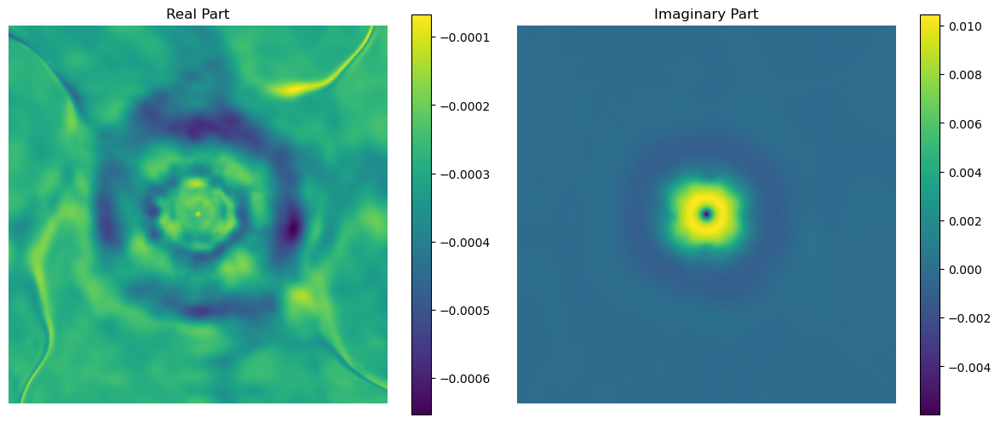

Step 19410, Total loss 230654.221768, iteration time 3.778661
Step 19450, Total loss 265458.070533, iteration time 3.645553
Step 19460, Total loss 274993.213484, iteration time 3.619367
Step 19470, Total loss 209756.754241, iteration time 3.669622
Step 19480, Total loss 236535.267892, iteration time 3.672681
Step 19490, Total loss 350748.867759, iteration time 3.650291
Step 19500, Total loss 234875.347818, iteration time 3.715096
Checkpoint saved at step 19500


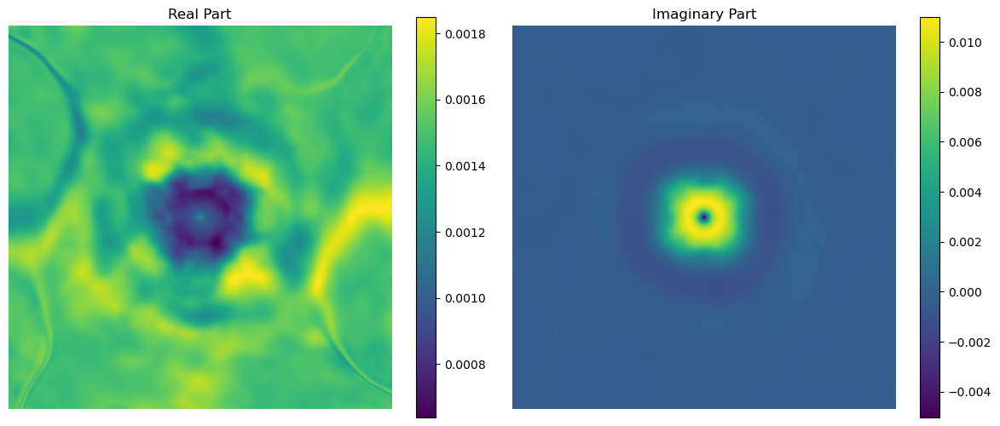

Step 19510, Total loss 224358.074660, iteration time 3.641864
Step 19520, Total loss 307628.773150, iteration time 3.722221
Step 19530, Total loss 192463.893000, iteration time 3.670564
Step 19540, Total loss 253416.100670, iteration time 3.633126
Step 19550, Total loss 303545.436600, iteration time 3.653525
Step 19560, Total loss 207447.166582, iteration time 3.718322
Step 19570, Total loss 274973.242931, iteration time 3.635147
Step 19580, Total loss 246238.740755, iteration time 3.685452
Step 19590, Total loss 278441.018654, iteration time 3.456618
Step 19600, Total loss 345334.217725, iteration time 3.689769
Checkpoint saved at step 19600


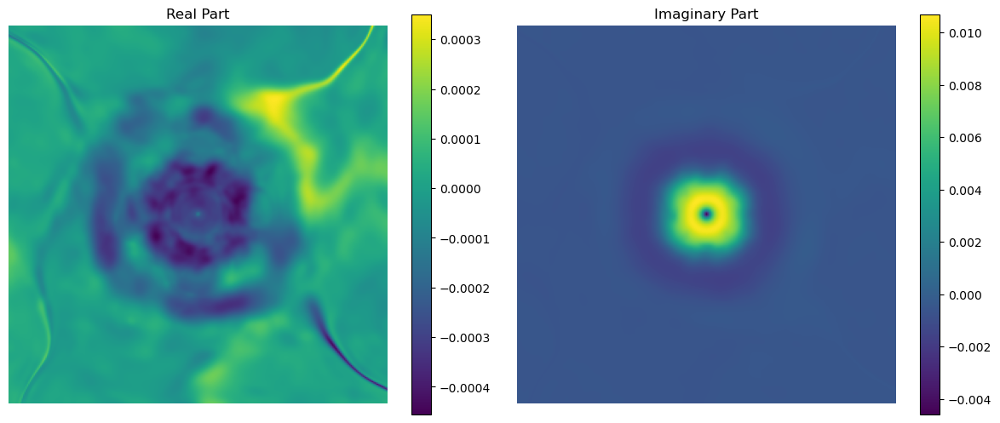

Step 19610, Total loss 388647.433390, iteration time 3.591783
Step 19620, Total loss 210069.275278, iteration time 3.666978
Step 19630, Total loss 246350.792355, iteration time 3.633957
Step 19640, Total loss 267648.397246, iteration time 3.601774
Step 19650, Total loss 319032.794623, iteration time 3.657288
Step 19660, Total loss 251777.260827, iteration time 3.641054
Step 19670, Total loss 262199.582672, iteration time 3.679206
Step 19680, Total loss 309126.858980, iteration time 3.698014
Step 19710, Total loss 199801.200579, iteration time 3.664517
Step 19720, Total loss 248969.284082, iteration time 3.673671
Step 19730, Total loss 247288.273574, iteration time 3.659628
Step 19740, Total loss 232750.815912, iteration time 3.719424
Step 19750, Total loss 412610.988493, iteration time 3.656787
Step 19760, Total loss 263969.308860, iteration time 3.633491
Step 19770, Total loss 273500.047772, iteration time 3.694117
Step 19780, Total loss 232889.140173, iteration time 3.703928
Step 197

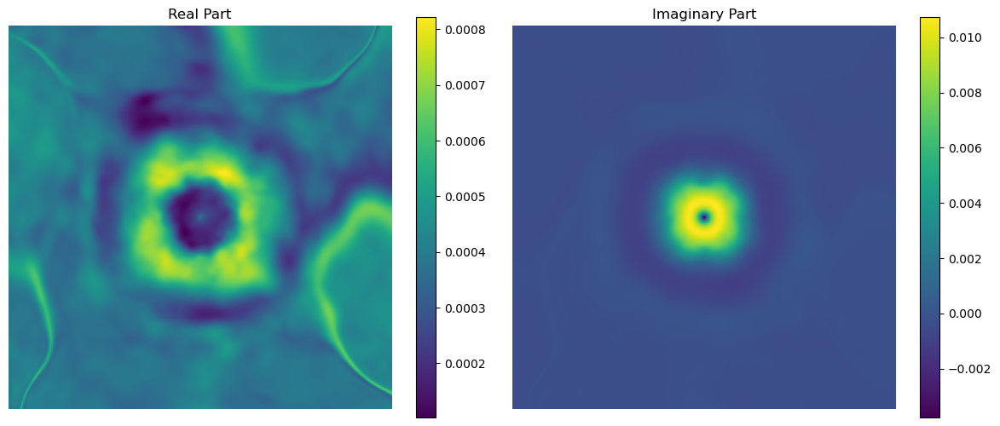

Step 19810, Total loss 150526.123424, iteration time 3.650583
Step 19820, Total loss 232410.147550, iteration time 3.625847
Step 19830, Total loss 148470.474181, iteration time 3.612645
Step 19840, Total loss 303536.962801, iteration time 3.651546
Step 19850, Total loss 206384.610307, iteration time 3.693599
Step 19860, Total loss 196531.823673, iteration time 3.643897
Step 19870, Total loss 170955.903453, iteration time 3.628380
Step 19880, Total loss 251718.121537, iteration time 3.612189
Step 19890, Total loss 221531.611177, iteration time 3.679218
Step 19900, Total loss 327715.496564, iteration time 3.693692
Checkpoint saved at step 19900


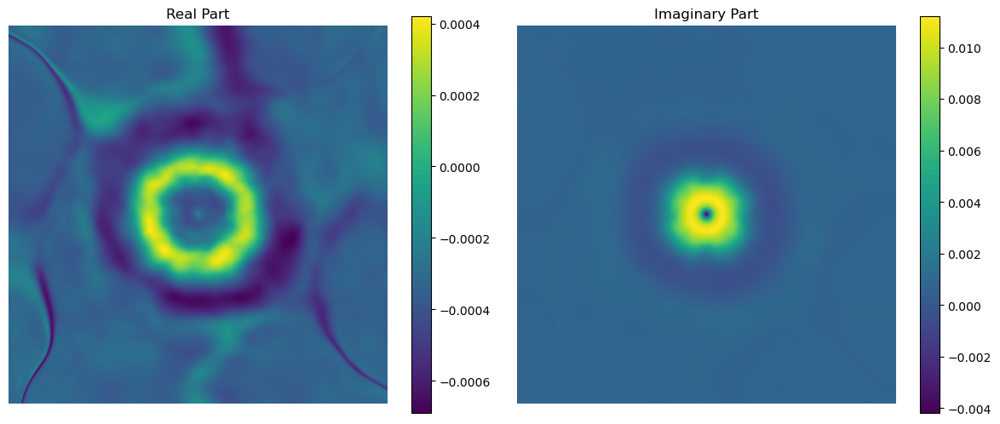

Step 19910, Total loss 215028.219508, iteration time 3.616041
Step 19920, Total loss 310977.902529, iteration time 3.719784
Step 19930, Total loss 199004.296070, iteration time 3.609257
Step 19940, Total loss 254193.811158, iteration time 3.696424
Step 19950, Total loss 227191.429689, iteration time 3.713431
Step 19960, Total loss 189070.018274, iteration time 3.626558
Step 19970, Total loss 263981.038118, iteration time 3.720140
Step 20010, Total loss 320543.154444, iteration time 3.682293
Step 20020, Total loss 196667.563449, iteration time 3.607024
Step 20030, Total loss 276645.824337, iteration time 3.620327
Step 20040, Total loss 254460.329421, iteration time 3.628430
Step 20050, Total loss 167191.153563, iteration time 3.583465
Step 20060, Total loss 236487.399533, iteration time 3.668409
Step 20070, Total loss 205327.987723, iteration time 3.681848
Step 20080, Total loss 214204.716839, iteration time 3.697498
Step 20090, Total loss 243269.004552, iteration time 3.625519
Step 201

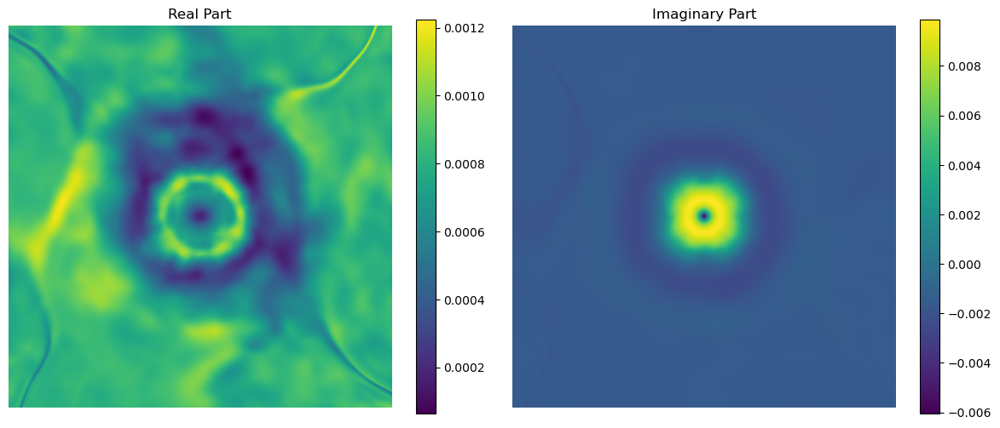

Step 20110, Total loss 159814.800380, iteration time 3.672139
Step 20120, Total loss 227464.763081, iteration time 3.713712
Step 20130, Total loss 171746.788569, iteration time 3.708015
Step 20140, Total loss 216600.351018, iteration time 3.570114
Step 20150, Total loss 351508.712934, iteration time 3.647616
Step 20160, Total loss 262593.952782, iteration time 3.645434
Step 20170, Total loss 237689.068066, iteration time 3.623842
Step 20180, Total loss 218355.964099, iteration time 3.617644
Step 20190, Total loss 200091.797686, iteration time 3.650203
Step 20200, Total loss 228777.226001, iteration time 3.647289
Checkpoint saved at step 20200


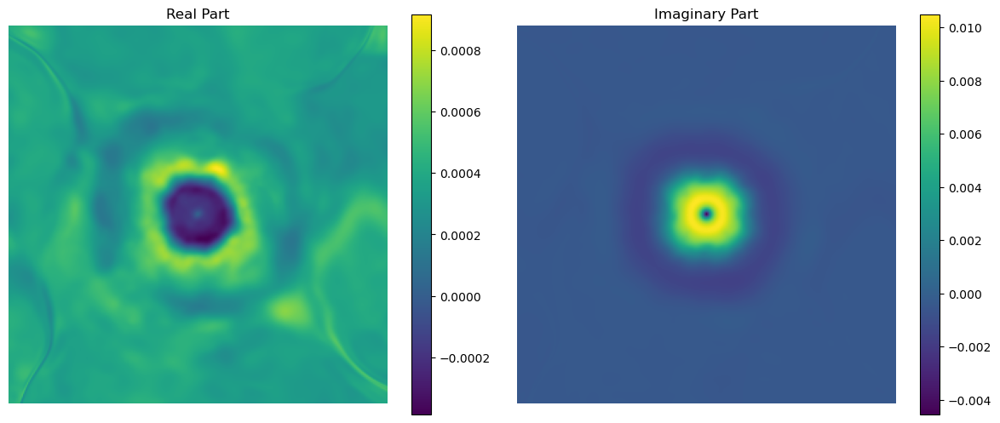

Step 20210, Total loss 242973.210383, iteration time 3.675122
Step 20220, Total loss 216674.673916, iteration time 3.631081
Step 20230, Total loss 236818.102930, iteration time 3.664593
Step 20240, Total loss 212244.306580, iteration time 3.743519
Step 20270, Total loss 335030.460144, iteration time 3.686974
Step 20280, Total loss 266561.028017, iteration time 3.708537
Step 20290, Total loss 202678.407419, iteration time 3.722996
Step 20300, Total loss 289466.589697, iteration time 3.620856
Checkpoint saved at step 20300


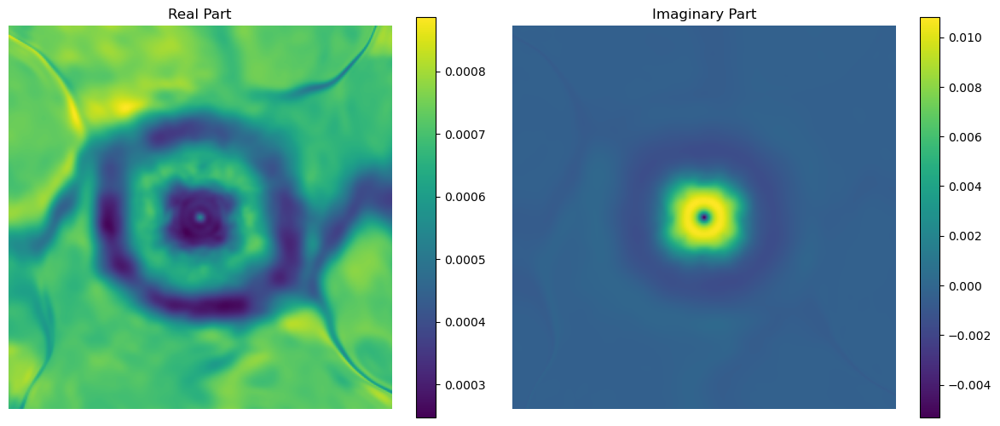

Step 20310, Total loss 293450.280377, iteration time 3.709544
Step 20320, Total loss 208030.701739, iteration time 3.675678
Step 20330, Total loss 263075.679224, iteration time 3.704780
Step 20340, Total loss 160669.483288, iteration time 3.482179
Step 20350, Total loss 321884.415857, iteration time 3.702873
Step 20360, Total loss 157724.577134, iteration time 3.630797
Step 20370, Total loss 255669.006231, iteration time 3.825824
Step 20380, Total loss 214901.357504, iteration time 3.567790
Step 20390, Total loss 199475.642534, iteration time 3.651721
Step 20400, Total loss 156986.365311, iteration time 3.656076
Checkpoint saved at step 20400


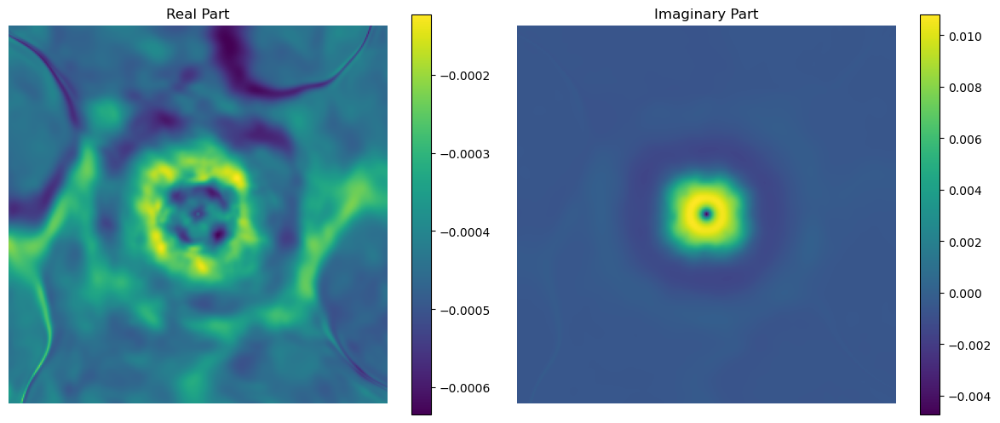

Step 20410, Total loss 273010.683778, iteration time 3.634030
Step 20420, Total loss 319159.714144, iteration time 3.658085
Step 20430, Total loss 208483.193837, iteration time 3.659560
Step 20440, Total loss 257273.417313, iteration time 3.663459
Step 20450, Total loss 331393.279128, iteration time 3.599971
Step 20460, Total loss 207587.653607, iteration time 3.626157
Step 20470, Total loss 209037.447115, iteration time 3.763287
Step 20480, Total loss 319174.025827, iteration time 3.671987
Step 20490, Total loss 204426.742688, iteration time 3.678706
Step 20500, Total loss 300041.388207, iteration time 3.643610
Checkpoint saved at step 20500


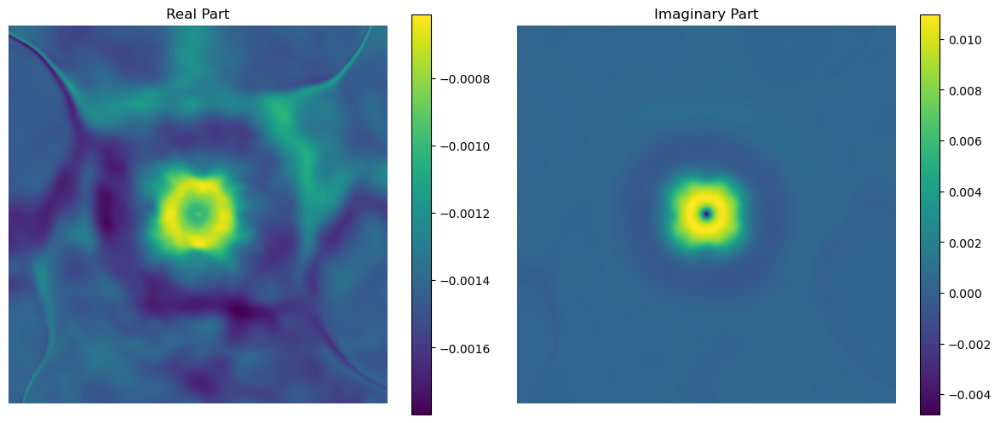

Step 20510, Total loss 271825.173628, iteration time 3.689953
Step 20520, Total loss 281331.022964, iteration time 3.705444
Step 20530, Total loss 257086.654808, iteration time 3.664740
Step 20540, Total loss 333235.680798, iteration time 3.660104
Step 20550, Total loss 173581.228917, iteration time 3.668038
Step 20560, Total loss 163701.988410, iteration time 3.648831
Step 20570, Total loss 271725.686554, iteration time 3.687075
Step 20580, Total loss 223898.173867, iteration time 3.672771
Step 20590, Total loss 283505.950508, iteration time 3.599038
Step 20600, Total loss 243583.851244, iteration time 3.811362
Checkpoint saved at step 20600


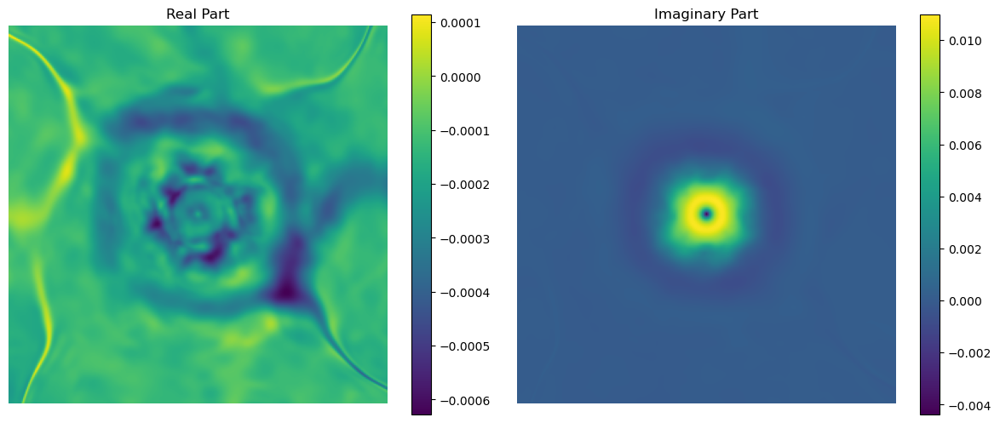

Step 20610, Total loss 263862.825967, iteration time 3.448601
Step 20620, Total loss 207184.582246, iteration time 3.720004
Step 20630, Total loss 217511.638725, iteration time 3.662900
Step 20640, Total loss 243009.081790, iteration time 3.652544
Step 20650, Total loss 361486.158694, iteration time 3.613867


In [ ]:
import os
from torch.cuda.amp import autocast, GradScaler

# Create a directory to save checkpoints
save_dir = './checkpoints2'
os.makedirs(save_dir, exist_ok=True)

batchsz = 4096*2
total_steps = 20000
steps_til_summary = 10
steps_til_disp = 100

sidelength = 287 #319

omega = 15.0 #50
k = 1#batchsz/5000
eps_real = torch.zeros((1,2))
eps_real[0,0] = 1.0
a0 = 50.0
Lpml = 0.5

# Checkpoint loading configuration
load_checkpoint = True  # Set to True to load a checkpoint
checkpoint_to_load = save_dir+'/model_step_15300.pth'  # Specify which checkpoint to load

# Initialize model and optimizer
helmholtz_siren = Siren(in_features=2, out_features=2, hidden_features=256,
                      hidden_layers=4, outermost_linear=True)
helmholtz_siren.cuda()

learning_rate = 2e-5#1e-6#5e-6
optim = torch.optim.Adam(lr=learning_rate, params=helmholtz_siren.parameters())

# Load checkpoint if specified
start_step = 0
if load_checkpoint and os.path.exists(checkpoint_to_load):
    print(f"Loading checkpoint from {checkpoint_to_load}")
    checkpoint = torch.load(checkpoint_to_load)
    helmholtz_siren.load_state_dict(checkpoint['model_state_dict'])
    optim.load_state_dict(checkpoint['optimizer_state_dict'])
    # Set new learning rate
    for param_group in optim.param_groups:
        param_group['lr'] = learning_rate
    start_step = checkpoint['step']
    print(f"Resuming from step {start_step}")
    print(f"Previous loss: {checkpoint['loss']:.6e}")
elif load_checkpoint:
    print(f"Warning: Checkpoint {checkpoint_to_load} not found. Starting from scratch.")
    sys.exit("Exiting notebook early.")

# Setup for training
helmholtz_obj = HelmholtzEqn(sidelength)
dataloader = DataLoader(helmholtz_obj, batch_size=batchsz, shuffle=True, pin_memory=True)

scaler = GradScaler()

# Training loop
end_step = start_step + total_steps

for step in range(start_step, end_step):
    if step % steps_til_summary == 0:
        start_time = time.time()

    helmholtz_siren.train()
    total_loss = 0.0
    total_samples = 0

    for coords, ereal, eimag, src, epsr, epsi in dataloader:
        src_full = torch.zeros((coords.shape[0],2))
        # Move batch to GPU
        coords = coords.cuda(non_blocking=True)
        #print("x min/max",torch.min(coords[:,0]),torch.max(coords[:,0]))
        #print("y min/max",torch.min(coords[:,1]),torch.max(coords[:,1]))
        src_full[:,1] = -src.squeeze()#/omega        
        src_full = src_full.cuda(non_blocking=True)
        eps_real = eps_real.cuda(non_blocking=True)
        #epsr = epsr.cuda(non_blocking=True)
        #epsi = epsi.cuda(non_blocking=True)
        
        optim.zero_grad(set_to_none=True)
        
        with autocast():
            pred, coords = helmholtz_siren(coords)
            #loss = helmholtz_mse(pred[:,0:1], pred[:,1:2], coords, epsr, epsi, src, omega, k)
            loss = helmholtz_pml(pred, coords, eps_real, a0, Lpml, src_full, omega, k)
        
        scaler.scale(loss).backward()
        scaler.step(optim)
        scaler.update()
        
        total_loss += loss.item() * coords.shape[0]
        total_samples += coords.shape[0]
    
    if not step % steps_til_summary:
        avg_loss = total_loss / total_samples
        print("Step %d, Total loss %0.6f, iteration time %0.6f" % (step, avg_loss, time.time() - start_time))

    if not step % steps_til_disp:
        # save the current model checkpoint
        checkpoint_path = os.path.join(save_dir, f'model_step_{step}.pth')
        torch.save({
            'step': step,
            'model_state_dict': helmholtz_siren.state_dict(),
            'optimizer_state_dict': optim.state_dict(),
            'loss': loss.item(),
        }, checkpoint_path)
        print(f"Checkpoint saved at step {step}")
        
        # Visualize the current model output
        helmholtz_siren.eval()
        with torch.no_grad():
            # Get the full coordinate grid
            full_coords = helmholtz_obj.coords.cuda()
            full_pred, _ = helmholtz_siren(full_coords)
            
            # Extract real and imaginary parts and reshape to sidelengthxsidelength
            pred_real = full_pred[:, 0].cpu().numpy().reshape(sidelength, sidelength)
            pred_imag = full_pred[:, 1].cpu().numpy().reshape(sidelength, sidelength)
            
            # Create the plot
            fig, axes = plt.subplots(1, 2, figsize=(12, 5))
            
            im0 = axes[0].imshow(pred_real, cmap='viridis')
            axes[0].set_title('Real Part')
            axes[0].axis('off')
            plt.colorbar(im0, ax=axes[0])
            
            im1 = axes[1].imshow(pred_imag, cmap='viridis')
            axes[1].set_title('Imaginary Part')
            axes[1].axis('off')
            plt.colorbar(im1, ax=axes[1])
            
            plt.tight_layout()
            plt.show()
        
        helmholtz_siren.train()

#### Train the tanh/relu model

Loading checkpoint from ./checkpoints_relu/model_step_1000.pth
Resuming from step 1000
Previous loss: 6.612906e+02


/opt/conda/lib/python3.11/site-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Step 1000, Total loss 19165.820346, iteration time 3.352312
Checkpoint saved at step 1000


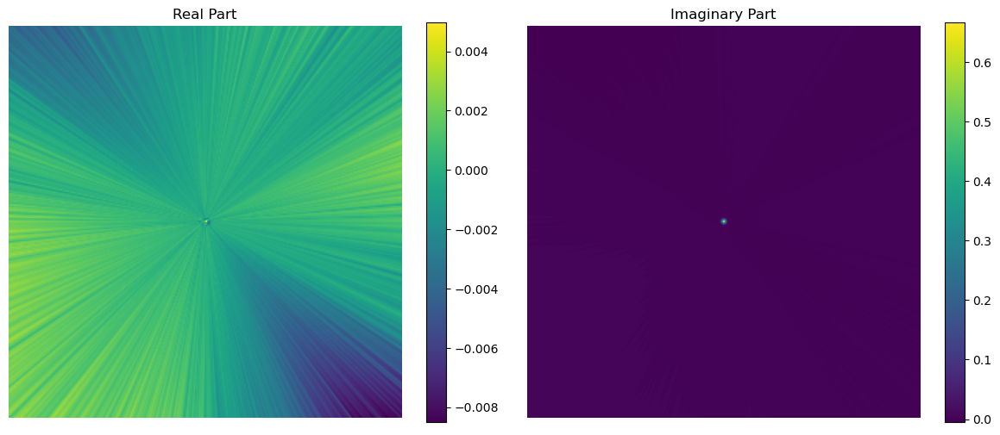

Step 1010, Total loss 34614.915140, iteration time 3.208139
Step 1020, Total loss 37018.292228, iteration time 3.100603
Step 1030, Total loss 20314.783889, iteration time 3.248052
Step 1040, Total loss 28364.622966, iteration time 3.128021
Step 1050, Total loss 46115.263745, iteration time 3.239326
Step 1060, Total loss 31916.343636, iteration time 3.115279
Step 1070, Total loss 26802.799875, iteration time 3.235917
Step 1080, Total loss 22612.330508, iteration time 3.140774
Step 1090, Total loss 77114.002570, iteration time 3.265256
Step 1100, Total loss 20386.533056, iteration time 3.138686
Checkpoint saved at step 1100


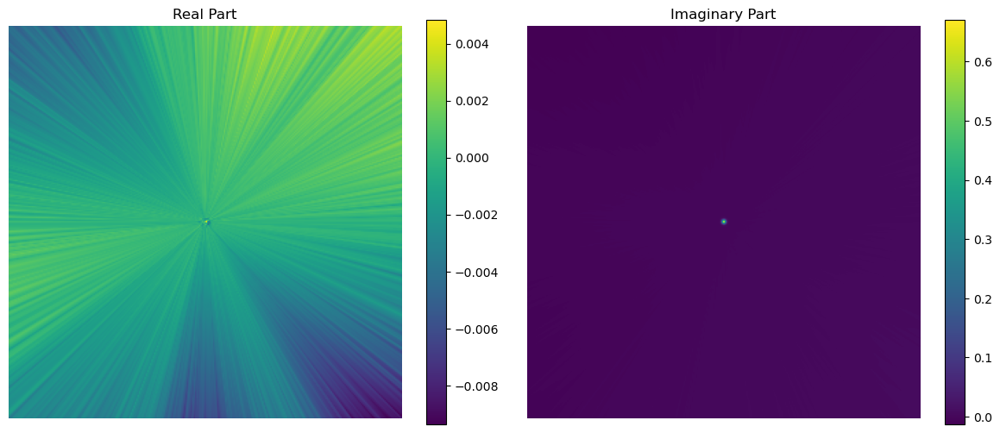

Step 1110, Total loss 35090.865573, iteration time 3.288124
Step 1120, Total loss 28256.763509, iteration time 3.111086
Step 1130, Total loss 33077.596285, iteration time 3.135301
Step 1140, Total loss 58206.589008, iteration time 3.155856
Step 1150, Total loss 31887.774329, iteration time 3.302804
Step 1160, Total loss 24720.679877, iteration time 3.175955
Step 1170, Total loss 30842.638324, iteration time 3.293831
Step 1180, Total loss 24786.797592, iteration time 3.130258
Step 1190, Total loss 31098.614819, iteration time 3.269867
Step 1200, Total loss 44192.219847, iteration time 3.190180
Checkpoint saved at step 1200


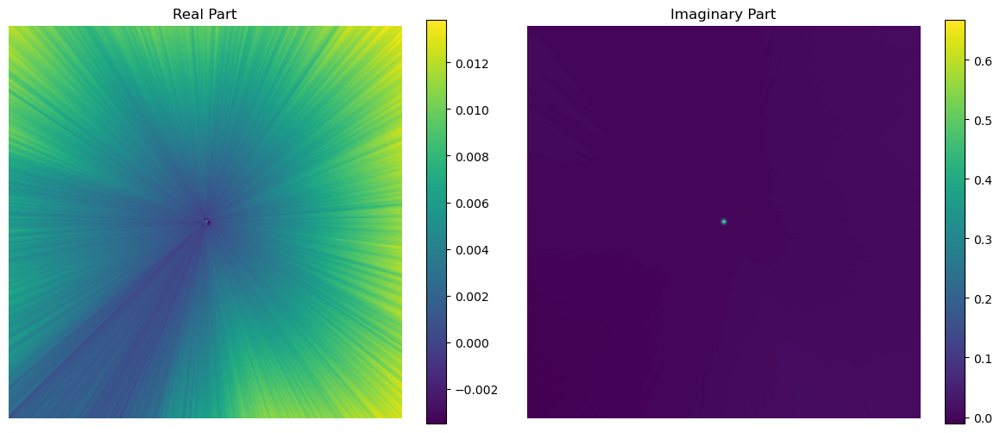

Step 1210, Total loss 18241.634332, iteration time 3.263320
Step 1220, Total loss 24195.674661, iteration time 3.098853
Step 1230, Total loss 32729.573882, iteration time 3.291673
Step 1240, Total loss 23430.645472, iteration time 3.231853
Step 1250, Total loss 30309.803488, iteration time 2.877281
Step 1260, Total loss 28263.193151, iteration time 3.124025
Step 1270, Total loss 19753.499207, iteration time 3.221223
Step 1280, Total loss 43448.089305, iteration time 3.216892
Step 1290, Total loss 20248.212586, iteration time 3.149026
Step 1300, Total loss 19181.286321, iteration time 3.306385
Checkpoint saved at step 1300


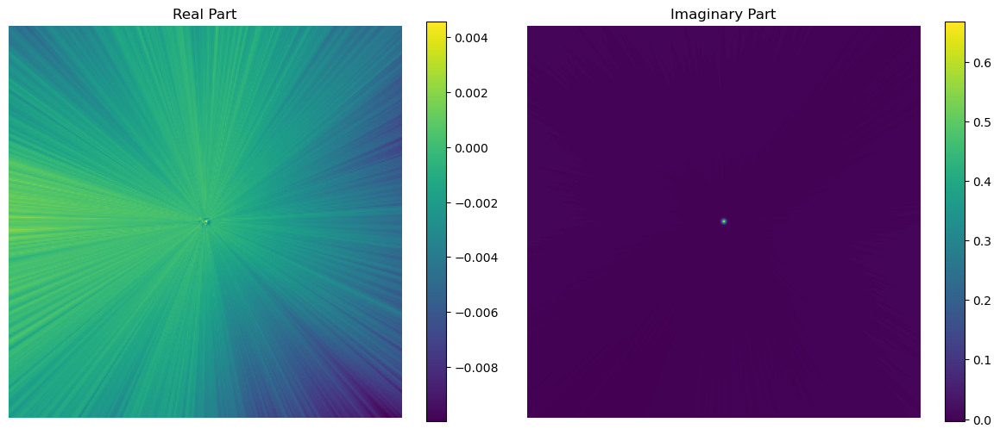

Step 1310, Total loss 64382.281524, iteration time 3.256282
Step 1320, Total loss 21407.056498, iteration time 3.036249
Step 1330, Total loss 18008.839257, iteration time 3.272606
Step 1340, Total loss 27076.397327, iteration time 3.277476
Step 1350, Total loss 25023.186314, iteration time 3.213515
Step 1360, Total loss 32925.701263, iteration time 3.172514
Step 1370, Total loss 48120.728872, iteration time 3.357674
Step 1380, Total loss 31123.758000, iteration time 3.006812
Step 1390, Total loss 43073.412923, iteration time 3.299455
Step 1400, Total loss 18792.559593, iteration time 3.112270
Checkpoint saved at step 1400


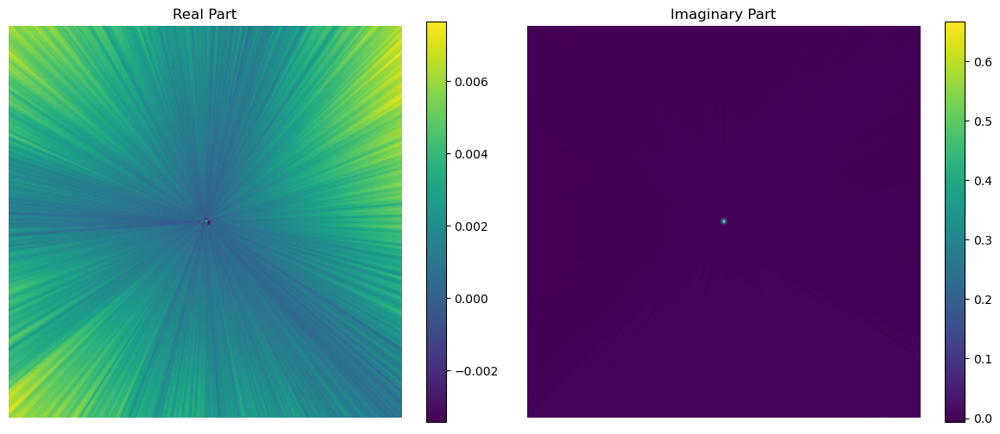

Step 1410, Total loss 26478.260147, iteration time 3.252061
Step 1420, Total loss 36979.074496, iteration time 3.163246
Step 1430, Total loss 25036.602480, iteration time 3.331523
Step 1440, Total loss 18758.890486, iteration time 3.202244
Step 1450, Total loss 38824.063752, iteration time 3.202508
Step 1460, Total loss 34903.585572, iteration time 3.322634
Step 1470, Total loss 20639.110060, iteration time 3.291521
Step 1480, Total loss 27868.898504, iteration time 3.187235
Step 1490, Total loss 33369.248760, iteration time 3.330442
Step 1500, Total loss 29377.463039, iteration time 3.180555
Checkpoint saved at step 1500


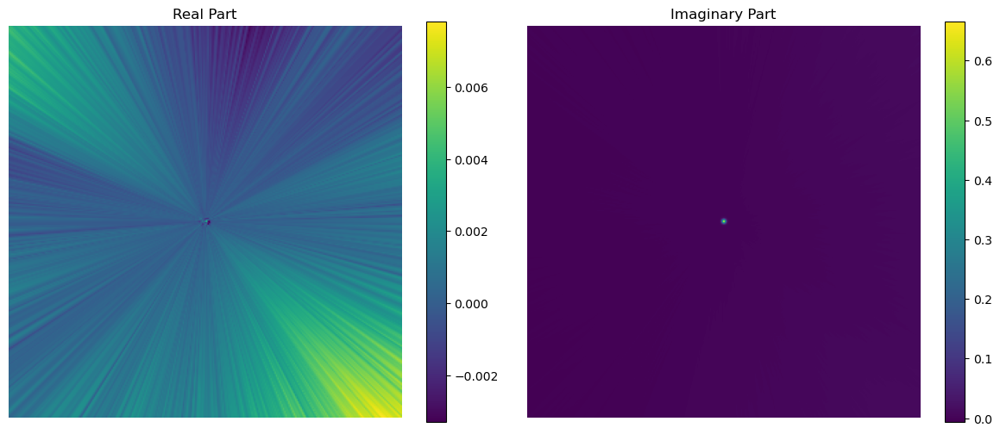

Step 1510, Total loss 27136.885454, iteration time 3.350442
Step 1520, Total loss 40794.945154, iteration time 2.997673
Step 1530, Total loss 18726.023269, iteration time 3.146520
Step 1540, Total loss 27842.478449, iteration time 3.055112
Step 1550, Total loss 35148.279060, iteration time 3.360486
Step 1560, Total loss 37027.364083, iteration time 3.161562
Step 1570, Total loss 28515.310466, iteration time 3.321258
Step 1580, Total loss 19682.697486, iteration time 3.189439
Step 1590, Total loss 29840.280693, iteration time 3.316741
Step 1600, Total loss 28274.122226, iteration time 3.142568
Checkpoint saved at step 1600


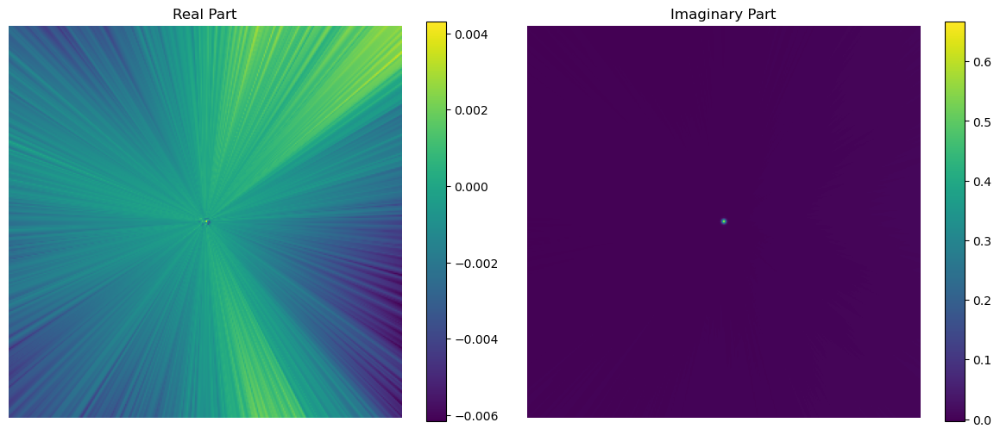

Step 1610, Total loss 29330.329661, iteration time 3.255806
Step 1620, Total loss 34546.939096, iteration time 3.200085
Step 1630, Total loss 35696.201993, iteration time 3.283784
Step 1640, Total loss 27641.531518, iteration time 3.146646
Step 1650, Total loss 39128.492268, iteration time 3.369187
Step 1660, Total loss 29767.970634, iteration time 3.147158
Step 1670, Total loss 47057.301167, iteration time 3.336395
Step 1680, Total loss 24716.498531, iteration time 3.395323
Step 1690, Total loss 21004.123488, iteration time 3.313786
Step 1700, Total loss 23292.377793, iteration time 3.175607
Checkpoint saved at step 1700


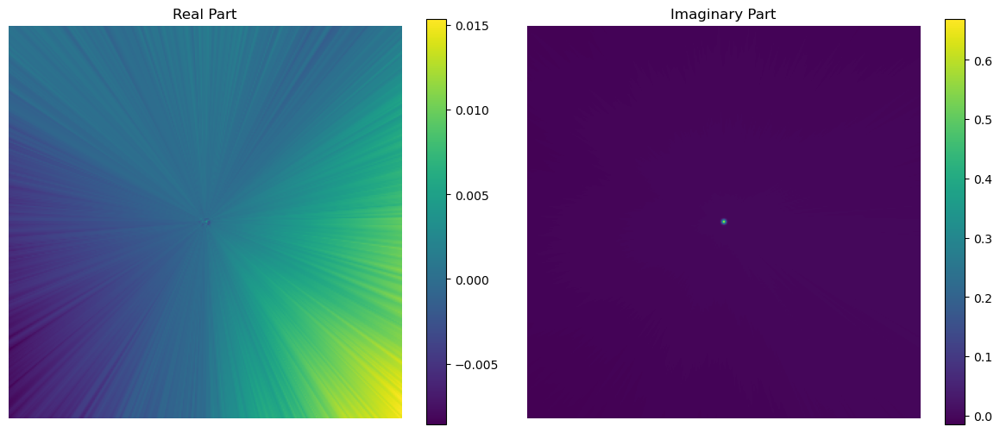

Step 1710, Total loss 24951.950093, iteration time 3.314110
Step 1720, Total loss 30181.348697, iteration time 3.220956
Step 1730, Total loss 21783.883761, iteration time 3.293299
Step 1740, Total loss 32538.411471, iteration time 3.142609
Step 1750, Total loss 25093.002127, iteration time 3.289901
Step 1760, Total loss 45946.579658, iteration time 2.983411
Step 1770, Total loss 38846.676259, iteration time 3.235096
Step 1780, Total loss 48370.756710, iteration time 3.163596
Step 1790, Total loss 25090.781163, iteration time 3.308821
Step 1800, Total loss 16213.764293, iteration time 3.117312
Checkpoint saved at step 1800


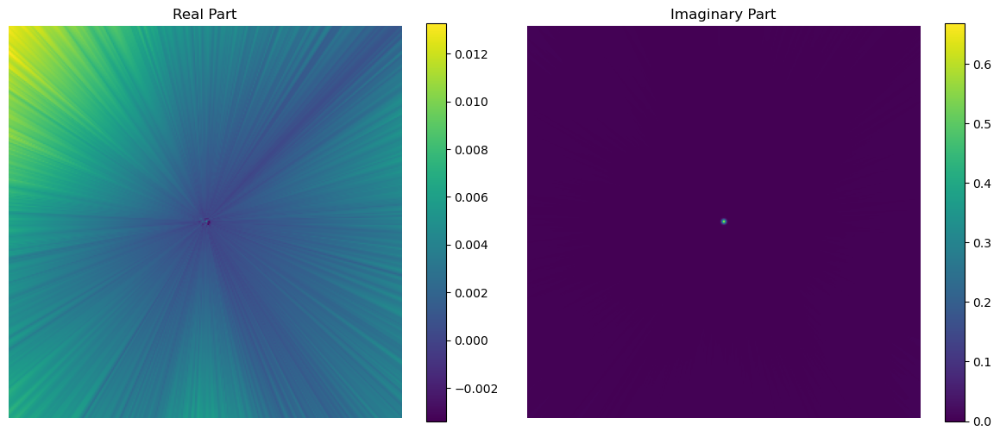

Step 1810, Total loss 21584.710846, iteration time 3.231968
Step 1820, Total loss 53295.289058, iteration time 3.207371
Step 1830, Total loss 15796.945691, iteration time 3.372847
Step 1840, Total loss 24367.672792, iteration time 3.171633
Step 1850, Total loss 42517.019993, iteration time 3.160022
Step 1860, Total loss 48679.342792, iteration time 3.173225
Step 1870, Total loss 23553.696068, iteration time 2.847551
Step 1880, Total loss 30444.251739, iteration time 3.171914
Step 1890, Total loss 22474.770246, iteration time 3.311584
Step 1900, Total loss 26122.306195, iteration time 3.118883
Checkpoint saved at step 1900


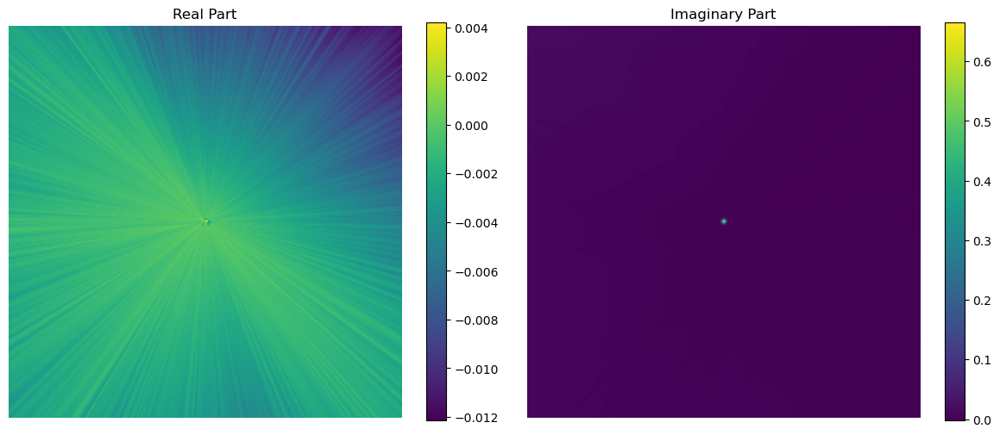

Step 1910, Total loss 23555.774466, iteration time 3.358130
Step 1920, Total loss 21311.664534, iteration time 3.278967
Step 1930, Total loss 27396.935159, iteration time 3.086004
Step 1940, Total loss 26164.989396, iteration time 3.178862
Step 1950, Total loss 37154.971171, iteration time 3.037637
Step 1960, Total loss 17306.471158, iteration time 3.207226
Step 1970, Total loss 20892.683155, iteration time 3.446379
Step 1980, Total loss 27627.665601, iteration time 3.102366
Step 1990, Total loss 44280.458982, iteration time 3.378439
Step 2000, Total loss 58868.175909, iteration time 3.212706
Checkpoint saved at step 2000


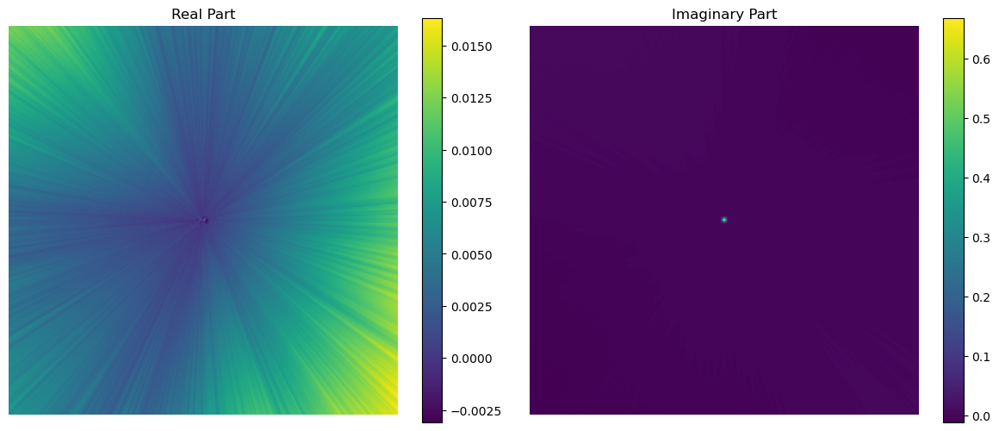

Step 2010, Total loss 23455.063371, iteration time 3.187732


Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7f69612083d0>>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.11/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(

KeyboardInterrupt: 

KeyboardInterrupt



In [9]:
import os
from torch.cuda.amp import autocast, GradScaler

# Create a directory to save checkpoints
save_dir = './checkpoints_relu'
os.makedirs(save_dir, exist_ok=True)

batchsz = 4096*2
total_steps = 20000
steps_til_summary = 10
steps_til_disp = 100

sidelength = 287 #319

omega = 15.0 #50
k = 30#batchsz/5000
eps_real = torch.zeros((1,2))
eps_real[0,0] = 1.0
a0 = 5.0
Lpml = 0.5

# Checkpoint loading configuration
load_checkpoint = True  # Set to True to load a checkpoint
checkpoint_to_load = save_dir+'/model_step_1000.pth'  # Specify which checkpoint to load

# Initialize model and optimizer
helmholtz_model = ReLUNetwork(in_features=2, out_features=2, hidden_features=256,
                      hidden_layers=4, outermost_linear=True)
helmholtz_model.cuda()

learning_rate = 2e-5#1e-6#5e-6
optim = torch.optim.Adam(lr=learning_rate, params=helmholtz_model.parameters())

# Load checkpoint if specified
start_step = 0
if load_checkpoint and os.path.exists(checkpoint_to_load):
    print(f"Loading checkpoint from {checkpoint_to_load}")
    checkpoint = torch.load(checkpoint_to_load)
    helmholtz_model.load_state_dict(checkpoint['model_state_dict'])
    optim.load_state_dict(checkpoint['optimizer_state_dict'])
    # Set new learning rate
    for param_group in optim.param_groups:
        param_group['lr'] = learning_rate
    start_step = checkpoint['step']
    print(f"Resuming from step {start_step}")
    print(f"Previous loss: {checkpoint['loss']:.6e}")
elif load_checkpoint:
    print(f"Warning: Checkpoint {checkpoint_to_load} not found. Starting from scratch.")
    sys.exit("Exiting notebook early.")

# Setup for training
helmholtz_obj = HelmholtzEqn(sidelength)
dataloader = DataLoader(helmholtz_obj, batch_size=batchsz, shuffle=True, pin_memory=True)

scaler = GradScaler()

# Training loop
end_step = start_step + total_steps

for step in range(start_step, end_step):
    if step % steps_til_summary == 0:
        start_time = time.time()

    helmholtz_model.train()
    total_loss = 0.0
    total_samples = 0

    for coords, ereal, eimag, src, epsr, epsi in dataloader:
        src_full = torch.zeros((coords.shape[0],2))
        # Move batch to GPU
        coords = coords.cuda(non_blocking=True)
        #print("x min/max",torch.min(coords[:,0]),torch.max(coords[:,0]))
        #print("y min/max",torch.min(coords[:,1]),torch.max(coords[:,1]))
        src_full[:,1] = -src.squeeze()#/omega        
        src_full = src_full.cuda(non_blocking=True)
        eps_real = eps_real.cuda(non_blocking=True)
        #epsr = epsr.cuda(non_blocking=True)
        #epsi = epsi.cuda(non_blocking=True)
        
        optim.zero_grad(set_to_none=True)
        
        with autocast():
            pred, coords = helmholtz_model(coords)
            #loss = helmholtz_mse(pred[:,0:1], pred[:,1:2], coords, epsr, epsi, src, omega, k)
            loss = helmholtz_pml(pred, coords, eps_real, a0, Lpml, src_full, omega, k)
        
        scaler.scale(loss).backward()
        scaler.step(optim)
        scaler.update()
        
        total_loss += loss.item() * coords.shape[0]
        total_samples += coords.shape[0]
    
    if not step % steps_til_summary:
        avg_loss = total_loss / total_samples
        print("Step %d, Total loss %0.6f, iteration time %0.6f" % (step, avg_loss, time.time() - start_time))

    if not step % steps_til_disp:
        # save the current model checkpoint
        checkpoint_path = os.path.join(save_dir, f'model_step_{step}.pth')
        torch.save({
            'step': step,
            'model_state_dict': helmholtz_model.state_dict(),
            'optimizer_state_dict': optim.state_dict(),
            'loss': loss.item(),
        }, checkpoint_path)
        print(f"Checkpoint saved at step {step}")
        
        # Visualize the current model output
        helmholtz_model.eval()
        with torch.no_grad():
            # Get the full coordinate grid
            full_coords = helmholtz_obj.coords.cuda()
            full_pred, _ = helmholtz_model(full_coords)
            
            # Extract real and imaginary parts and reshape to sidelengthxsidelength
            pred_real = full_pred[:, 0].cpu().numpy().reshape(sidelength, sidelength)
            pred_imag = full_pred[:, 1].cpu().numpy().reshape(sidelength, sidelength)
            
            # Create the plot
            fig, axes = plt.subplots(1, 2, figsize=(12, 5))
            
            im0 = axes[0].imshow(pred_real, cmap='viridis')
            axes[0].set_title('Real Part')
            axes[0].axis('off')
            plt.colorbar(im0, ax=axes[0])
            
            im1 = axes[1].imshow(pred_imag, cmap='viridis')
            axes[1].set_title('Imaginary Part')
            axes[1].axis('off')
            plt.colorbar(im1, ax=axes[1])
            
            plt.tight_layout()
            plt.show()
        
        helmholtz_model.train()

## Visualize the training from a checkpoints directory

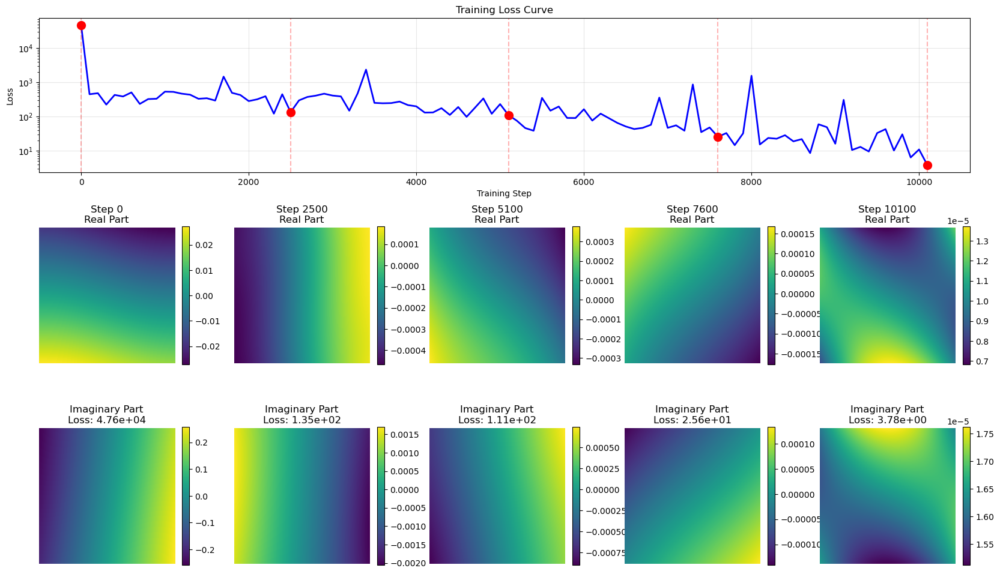

In [12]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt

# Configuration
checkpoint_dir = './checkpoints_tanh'
model_type = 'tanh'
grid_size = 287

# Get all checkpoints
checkpoint_files = sorted([f for f in os.listdir(checkpoint_dir) if f.startswith('model_step_')])
steps = []
losses = []

for f in checkpoint_files:
    step = int(f.split('_')[-1].split('.')[0])
    checkpoint = torch.load(os.path.join(checkpoint_dir, f))
    steps.append(step)
    losses.append(checkpoint['loss'])

# Sort by step
steps, losses = zip(*sorted(zip(steps, losses)))

# Plot loss curve with snapshots at specific points
snapshot_steps = [steps[0], steps[len(steps)//4], steps[len(steps)//2], 
                  steps[3*len(steps)//4], steps[-1]]
# snapshot_steps = [steps[0], steps[1], steps[10], 
#                   steps[20], steps[50]]

helmholtz_obj = HelmholtzEqn(grid_size)

fig = plt.figure(figsize=(20, 12))
gs = fig.add_gridspec(3, len(snapshot_steps), hspace=0.3, wspace=0.3)


def load_model(checkpoint_path, model_type):
    """Load model based on type"""
    checkpoint = torch.load(checkpoint_path)
    state_dict = checkpoint['model_state_dict']
    
    if model_type == 'siren':
        # Detect SIREN architecture
        max_layer_idx = max([int(k.split('.')[1]) for k in state_dict.keys() if k.startswith('net.')])
        num_hidden_layers = max_layer_idx - 1
        has_linear_in_last = f'net.{max_layer_idx}.linear.weight' in state_dict
        outermost_linear = not has_linear_in_last
        
        model = Siren(in_features=2, out_features=2, hidden_features=256,
                      hidden_layers=num_hidden_layers, outermost_linear=outermost_linear)
    
    elif model_type == 'tanh':
        # For TanhNetwork, count layers differently
        # Each pair of (Linear, Tanh) is one layer
        linear_layers = [k for k in state_dict.keys() if 'weight' in k and k.startswith('net.')]
        num_linear_layers = len(linear_layers)
        # num_linear_layers = input_layer + hidden_layers + output_layer
        # So hidden_layers = num_linear_layers - 2
        num_hidden_layers = num_linear_layers - 2
        
        model = TanhNetwork(in_features=2, out_features=2, hidden_features=256,
                           hidden_layers=num_hidden_layers, outermost_linear=True)
    
    elif model_type == 'relu':
        linear_layers = [k for k in state_dict.keys() if 'weight' in k and k.startswith('net.')]
        num_linear_layers = len(linear_layers)
        num_hidden_layers = num_linear_layers - 2
        
        model = ReLUNetwork(in_features=2, out_features=2, hidden_features=256,
                           hidden_layers=num_hidden_layers, outermost_linear=True)
    
    model.cuda()
    model.load_state_dict(state_dict)
    model.eval()
    
    return model, checkpoint

# Top row: loss curve
ax_loss = fig.add_subplot(gs[0, :])
ax_loss.plot(steps, losses, 'b-', linewidth=2)
ax_loss.set_xlabel('Training Step')
ax_loss.set_ylabel('Loss')
ax_loss.set_title('Training Loss Curve')
ax_loss.set_yscale('log')
ax_loss.grid(True, alpha=0.3)

# Mark snapshot points
for snap_step in snapshot_steps:
    snap_idx = steps.index(snap_step)
    ax_loss.plot(snap_step, losses[snap_idx], 'ro', markersize=10)
    ax_loss.axvline(snap_step, color='r', linestyle='--', alpha=0.3)

# Middle and bottom rows: snapshots
for col_idx, step in enumerate(snapshot_steps):
    checkpoint_path = os.path.join(checkpoint_dir, f'model_step_{step}.pth')
    #checkpoint = torch.load(checkpoint_path)
    model, checkpoint = load_model(checkpoint_path, model_type)

    # state_dict = checkpoint['model_state_dict']
    # max_layer_idx = max([int(k.split('.')[1]) for k in state_dict.keys() if k.startswith('net.')])
    # num_hidden_layers = max_layer_idx - 1
    # has_linear_in_last = f'net.{max_layer_idx}.linear.weight' in state_dict
    # outermost_linear = not has_linear_in_last
    
    #model = Siren(in_features=2, out_features=2, hidden_features=256,
    #              hidden_layers=num_hidden_layers, outermost_linear=outermost_linear)
    # model = TanhNetwork(in_features=2, out_features=2, hidden_features=256,
    #               hidden_layers=num_hidden_layers, outermost_linear=outermost_linear)
    # model.cuda()
    # model.load_state_dict(state_dict)
    # model.eval()
    
    with torch.no_grad():
        coords = helmholtz_obj.coords.cuda()
        pred, _ = model(coords)
        pred_real = pred[:, 0].cpu().numpy().reshape(grid_size, grid_size)
        pred_imag = pred[:, 1].cpu().numpy().reshape(grid_size, grid_size)
    
    # Real part
    ax_real = fig.add_subplot(gs[1, col_idx])
    im_real = ax_real.imshow(pred_real, cmap='viridis')
    ax_real.set_title(f'Step {step}\nReal Part')
    ax_real.axis('off')
    plt.colorbar(im_real, ax=ax_real, fraction=0.046)
    
    # Imaginary part
    ax_imag = fig.add_subplot(gs[2, col_idx])
    im_imag = ax_imag.imshow(pred_imag, cmap='viridis')
    ax_imag.set_title(f'Imaginary Part\nLoss: {checkpoint["loss"]:.2e}')
    ax_imag.axis('off')
    plt.colorbar(im_imag, ax=ax_imag, fraction=0.046)

plt.savefig('training_overview_tanh1.png', dpi=150, bbox_inches='tight')
plt.show()

Step 0: Loss = 4.759771e+04, Mean Error = 1.326156e-01, Max Error = 2.765547e-01
Step 100: Loss = 4.519339e+02, Mean Error = 3.249133e-03, Max Error = 2.125986e-02
Step 500: Loss = 3.887128e+02, Mean Error = 2.660261e-03, Max Error = 2.170544e-02
Step 1000: Loss = 5.373668e+02, Mean Error = 3.441348e-03, Max Error = 2.172405e-02
Step 2000: Loss = 2.846587e+02, Mean Error = 3.461387e-03, Max Error = 2.137933e-02
Step 5000: Loss = 2.318898e+02, Mean Error = 2.663970e-03, Max Error = 2.144363e-02


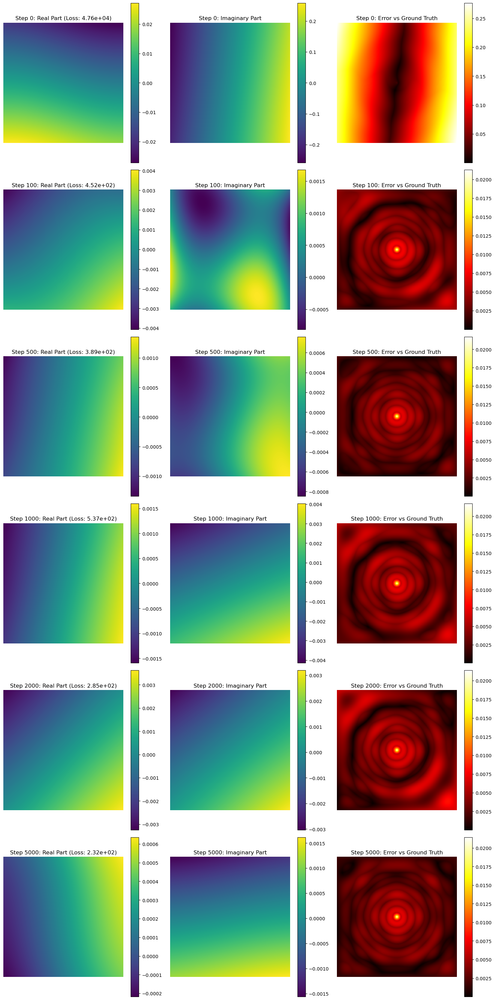

In [13]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt

# Configuration
checkpoint_dir = './checkpoints_tanh'  # or './checkpoints_siren' or './checkpoints_relu'
steps_to_plot = [0, 100, 500, 1000, 2000, 5000]
grid_size = 319
model_type = 'tanh'  # 'siren', 'tanh', or 'relu'

# Load ground truth
helmholtz_obj = HelmholtzEqn(grid_size)
gt_real = helmholtz_obj.pixels_real.numpy().reshape(grid_size, grid_size)
gt_imag = helmholtz_obj.pixels_imag.numpy().reshape(grid_size, grid_size)

# Create figure
n_steps = len(steps_to_plot)
fig, axes = plt.subplots(n_steps, 3, figsize=(15, 5*n_steps))

def load_model(checkpoint_path, model_type):
    """Load model based on type"""
    checkpoint = torch.load(checkpoint_path)
    state_dict = checkpoint['model_state_dict']
    
    if model_type == 'siren':
        # Detect SIREN architecture
        max_layer_idx = max([int(k.split('.')[1]) for k in state_dict.keys() if k.startswith('net.')])
        num_hidden_layers = max_layer_idx - 1
        has_linear_in_last = f'net.{max_layer_idx}.linear.weight' in state_dict
        outermost_linear = not has_linear_in_last
        
        model = Siren(in_features=2, out_features=2, hidden_features=256,
                      hidden_layers=num_hidden_layers, outermost_linear=outermost_linear)
    
    elif model_type == 'tanh':
        # For TanhNetwork, count layers differently
        # Each pair of (Linear, Tanh) is one layer
        linear_layers = [k for k in state_dict.keys() if 'weight' in k and k.startswith('net.')]
        num_linear_layers = len(linear_layers)
        # num_linear_layers = input_layer + hidden_layers + output_layer
        # So hidden_layers = num_linear_layers - 2
        num_hidden_layers = num_linear_layers - 2
        
        model = TanhNetwork(in_features=2, out_features=2, hidden_features=256,
                           hidden_layers=num_hidden_layers, outermost_linear=True)
    
    elif model_type == 'relu':
        linear_layers = [k for k in state_dict.keys() if 'weight' in k and k.startswith('net.')]
        num_linear_layers = len(linear_layers)
        num_hidden_layers = num_linear_layers - 2
        
        model = ReLUNetwork(in_features=2, out_features=2, hidden_features=256,
                           hidden_layers=num_hidden_layers, outermost_linear=True)
    
    model.cuda()
    model.load_state_dict(state_dict)
    model.eval()
    
    return model, checkpoint

for idx, step in enumerate(steps_to_plot):
    checkpoint_path = os.path.join(checkpoint_dir, f'model_step_{step}.pth')
    
    if not os.path.exists(checkpoint_path):
        print(f"Warning: Checkpoint at step {step} not found, skipping...")
        continue
    
    # Load model
    model, checkpoint = load_model(checkpoint_path, model_type)
    
    # Get predictions
    with torch.no_grad():
        coords = helmholtz_obj.coords.cuda()
        pred, _ = model(coords)
        pred_real = pred[:, 0].cpu().numpy().reshape(grid_size, grid_size)
        pred_imag = pred[:, 1].cpu().numpy().reshape(grid_size, grid_size)
    
    # Compute errors
    error_real = np.abs(pred_real - gt_real)
    error_imag = np.abs(pred_imag - gt_imag)
    
    # Plot real part
    im0 = axes[idx, 0].imshow(pred_real, cmap='viridis')
    axes[idx, 0].set_title(f'Step {step}: Real Part (Loss: {checkpoint["loss"]:.2e})')
    axes[idx, 0].axis('off')
    plt.colorbar(im0, ax=axes[idx, 0])
    
    # Plot imaginary part
    im1 = axes[idx, 1].imshow(pred_imag, cmap='viridis')
    axes[idx, 1].set_title(f'Step {step}: Imaginary Part')
    axes[idx, 1].axis('off')
    plt.colorbar(im1, ax=axes[idx, 1])
    
    # Plot combined error
    combined_error = error_real + error_imag
    im2 = axes[idx, 2].imshow(combined_error, cmap='hot')
    axes[idx, 2].set_title(f'Step {step}: Error vs Ground Truth')
    axes[idx, 2].axis('off')
    plt.colorbar(im2, ax=axes[idx, 2])
    
    print(f"Step {step}: Loss = {checkpoint['loss']:.6e}, "
          f"Mean Error = {combined_error.mean():.6e}, "
          f"Max Error = {combined_error.max():.6e}")

plt.tight_layout()
plt.savefig(f'training_progression_{model_type}.png', dpi=150, bbox_inches='tight')
plt.show()